In [1]:
import pickle 
import os
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import matplotlib.collections as collections
from sklearn.metrics import mean_squared_error as msem
from matplotlib.ticker import MaxNLocator
from pandas.io.formats.style import Styler

sns.set_style("whitegrid")
os.makedirs('./supporting_information/paper_plots', exist_ok = True)

from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
TEST_STORM_DATES = [
 ['19980622', '199806302359'],
 ['19981102', '199811122359'],
 ['19990109', '199901182359'],
 ['19990413', '199904192359'],
 ['20000116', '200001262359'],
 ['20000402', '200004122359'],
 ['20000519', '200005282359'],
 ['20010326', '200104042359'],
 ['20030526', '200306062359'],
 ['20030708', '200307182359'],
 ['20040118', '200401272359'],
 ['20041104', '200411142359'],
 ['20120910', '201210052359'],
 ['20130528', '201306042359'],
 ['20130626', '201307042359'],
 ['20150311', '201503212359'],
 ['20180822', '201809032359']
]

def convert_to_datetime(date):
    if len(date) == 8:
        return pd.to_datetime(date, format="%Y%m%d", errors="raise")
    elif len(date) == 12:
        return pd.to_datetime(date, format="%Y%m%d%H%M", errors="raise")
    else:
        return pd.to_datetime(
            date, errors="raise", infer_datetime_format=True, utc=True
        )

TEST_STORM_STARTS = []
TEST_STORM_ENDS = []

for date_start, date_end in TEST_STORM_DATES:
    TEST_STORM_STARTS.append(convert_to_datetime(date_start))
    TEST_STORM_ENDS.append(convert_to_datetime(date_end))

model_names = [
    '1h swics',
    '1h swics rt',
    '1h swepam rt',
    '2h swics',
    '2h swics rt',
    '2h swepam rt',
]

storm_indices = np.arange(26, 43)
start_storm_index = 26

In [3]:
!ls

LICENSE
README.md
metrics_and_plots.ipynb
old_stuff
predictions_SYM-H_1hour_swepam_real_time.csv
predictions_SYM-H_1hour_swics.csv
predictions_SYM-H_1hour_swics_real_time.csv
predictions_SYM-H_2hour_swepam_real_time.csv
predictions_SYM-H_2hour_swics.csv
predictions_SYM-H_2hour_swics_real_time.csv
rmses.csv
supporting_information
test_data_swepam.csv


In [4]:
df_60_swics = pd.read_csv('predictions_SYM-H_1hour_swics.csv')
df_60_swics_rt = pd.read_csv('predictions_SYM-H_1hour_swics_real_time.csv')
df_60_swepam_rt = pd.read_csv('predictions_SYM-H_1hour_swepam_real_time.csv')
df_120_swics = pd.read_csv('predictions_SYM-H_2hour_swics.csv')
df_120_swics_rt = pd.read_csv('predictions_SYM-H_2hour_swics_real_time.csv')
df_120_swepam_rt = pd.read_csv('predictions_SYM-H_2hour_swepam_real_time.csv')
rmses = pd.read_csv('rmses.csv')
df_swepam = pd.read_csv('test_data_swepam.csv', parse_dates = ['datetime']).set_index('datetime')
df_swepam['missing_swepam'] = df_swepam.isna().any(axis = 1)
df_swepam['missing_swepam_float'] = df_swepam['missing_swepam'].astype(float)
df_swepam.index = df_swepam.index.tz_localize(None)

In [5]:
df_60_swics['datetime'] = pd.to_datetime(df_60_swics['datetime'])
df_60_swics['predicted_SYM_H_1h_swics'] = df_60_swics['predicted_SYM_H-t60'].shift(12)
df_60_swics = df_60_swics.set_index('datetime')
df_60_swics_rt['datetime'] = pd.to_datetime(df_60_swics_rt['datetime'])
df_60_swics_rt['predicted_SYM_H_1h_real_time'] = df_60_swics_rt['predicted_SYM_H-t60'].shift(12)
df_60_swics_rt = df_60_swics_rt.set_index('datetime')
df_60_swepam_rt['datetime'] = pd.to_datetime(df_60_swepam_rt['datetime'])
df_60_swepam_rt['predicted_SYM_H_1h_real_time'] = df_60_swepam_rt['predicted_SYM_H-t60'].shift(12)
df_60_swepam_rt = df_60_swepam_rt.set_index('datetime')
df_120_swics['datetime'] = pd.to_datetime(df_120_swics['datetime'])
df_120_swics['predicted_SYM_H_2h_swics'] = df_120_swics['predicted_SYM_H-t120'].shift(24)
df_120_swics = df_120_swics.set_index('datetime')
df_120_swics_rt['datetime'] = pd.to_datetime(df_120_swics_rt['datetime'])
df_120_swics_rt['predicted_SYM_H_2h_real_time'] = df_120_swics_rt['predicted_SYM_H-t120'].shift(24)
df_120_swics_rt = df_120_swics_rt.set_index('datetime')
df_120_swepam_rt['datetime'] = pd.to_datetime(df_120_swepam_rt['datetime'])
df_120_swepam_rt['predicted_SYM_H_2h_real_time'] = df_120_swepam_rt['predicted_SYM_H-t120'].shift(24)
df_120_swepam_rt = df_120_swepam_rt.set_index('datetime')

all_dataframes = [
    df_60_swics,
    df_60_swics_rt, 
    df_60_swepam_rt,
    df_120_swics,
    df_120_swics_rt,
    df_120_swepam_rt,
]

In [6]:
for model_index in range(len(model_names)):
    
    for i,st_ind in enumerate(storm_indices):         
        dfx = all_dataframes[model_index].loc[all_dataframes[model_index]['storm_index'] == st_ind].copy()
        dfx = dfx[TEST_STORM_STARTS[i]:TEST_STORM_ENDS[i]].copy()
        mse = msem(dfx.iloc[:, 1], dfx.iloc[:, -1], squared = False)        
        print(f'Model: {model_names[model_index]}, storm {st_ind}: RMSE:{mse:.3f} from {dfx.index[0]} until {dfx.index[-1]}')
        rmses.loc[i, model_names[model_index]] = mse
        
    rmses.loc[17, model_names[model_index]] = np.mean(rmses.loc[:, model_names[model_index]].values[:-1])

Model: 1h swics, storm 26: RMSE:5.171 from 1998-06-22 00:00:00 until 1998-06-30 23:55:00
Model: 1h swics, storm 27: RMSE:7.455 from 1998-11-02 00:00:00 until 1998-11-12 23:55:00
Model: 1h swics, storm 28: RMSE:4.697 from 1999-01-09 00:00:00 until 1999-01-18 23:55:00
Model: 1h swics, storm 29: RMSE:4.941 from 1999-04-13 00:00:00 until 1999-04-19 23:55:00
Model: 1h swics, storm 30: RMSE:3.919 from 2000-01-16 00:00:00 until 2000-01-26 23:55:00
Model: 1h swics, storm 31: RMSE:6.700 from 2000-04-02 00:00:00 until 2000-04-12 23:55:00
Model: 1h swics, storm 32: RMSE:6.357 from 2000-05-19 00:00:00 until 2000-05-28 23:55:00
Model: 1h swics, storm 33: RMSE:14.217 from 2001-03-26 00:00:00 until 2001-04-04 23:55:00
Model: 1h swics, storm 34: RMSE:9.777 from 2003-05-26 00:00:00 until 2003-06-06 23:55:00
Model: 1h swics, storm 35: RMSE:6.089 from 2003-07-08 00:00:00 until 2003-07-18 23:55:00
Model: 1h swics, storm 36: RMSE:7.594 from 2004-01-18 00:00:00 until 2004-01-27 23:55:00
Model: 1h swics, sto

In [7]:
print('One hour ahead rmse metrics')
display(Styler(rmses[['Storm Nº',model_names[2],model_names[1],model_names[0],'GBM 1h ahead','LSTM-CNN 1h ahead',
             'Siciliano 1h ahead','Persistence 1h ahead','Burton 1h ahead']].set_index('Storm Nº'), precision = 3).apply(
    lambda col:['font-weight:bold' if x==col.min() else '' for x in col], axis = 1
).apply(lambda col:['text-decoration:underline' if x==col.nsmallest(2).iloc[-1] else '' for x in col], axis = 1).apply(
lambda col:['font-style:italic' if x==col.nsmallest(3).iloc[-1] else '' for x in col], axis = 1))

print(Styler(rmses[['Storm Nº',model_names[2],model_names[1],model_names[0],'GBM 1h ahead','LSTM-CNN 1h ahead',
             'Siciliano 1h ahead','Persistence 1h ahead','Burton 1h ahead']].set_index('Storm Nº'), precision = 3).apply(
    lambda col:['font-weight:bold' if x==col.min() else '' for x in col], axis = 1
).apply(lambda col:['text-decoration:underline' if x==col.nsmallest(2).iloc[-1] else '' for x in col], axis = 1).to_latex())

One hour ahead rmse metrics


,1h swepam rt,1h swics rt,1h swics,GBM 1h ahead,LSTM-CNN 1h ahead,Siciliano 1h ahead,Persistence 1h ahead,Burton 1h ahead
Storm Nº,,,,,,,,
26,5.676,5.355,5.171,5.863,6.630,6.700,7.631,6.839
27,7.652,7.655,7.455,7.729,8.913,8.900,9.623,7.955
28,5.209,4.945,4.697,4.281,5.858,5.400,5.814,5.697
29,4.796,5.218,4.941,5.833,6.683,7.200,7.174,6.511
30,3.934,4.156,3.919,4.927,5.200,5.600,4.810,4.614
31,6.778,6.707,6.700,8.277,8.584,10.700,10.429,8.838
32,7.076,6.654,6.357,6.841,7.259,8.300,10.528,9.487
33,14.810,14.211,14.217,14.492,13.340,16.300,21.167,16.630
34,10.511,10.215,9.777,10.190,10.034,11.300,10.913,10.888


\begin{tabular}{lrrrrrrrr}
 & 1h swepam rt & 1h swics rt & 1h swics & GBM 1h ahead & LSTM-CNN 1h ahead & Siciliano 1h ahead & Persistence 1h ahead & Burton 1h ahead \\
Storm Nº &  &  &  &  &  &  &  &  \\
26 & 5.676 & \text-decorationunderline 5.355 & \font-weightbold 5.171 & 5.863 & 6.630 & 6.700 & 7.631 & 6.839 \\
27 & \text-decorationunderline 7.652 & 7.655 & \font-weightbold 7.455 & 7.729 & 8.913 & 8.900 & 9.623 & 7.955 \\
28 & 5.209 & 4.945 & \text-decorationunderline 4.697 & \font-weightbold 4.281 & 5.858 & 5.400 & 5.814 & 5.697 \\
29 & \font-weightbold 4.796 & 5.218 & \text-decorationunderline 4.941 & 5.833 & 6.683 & 7.200 & 7.174 & 6.511 \\
30 & \text-decorationunderline 3.934 & 4.156 & \font-weightbold 3.919 & 4.927 & 5.200 & 5.600 & 4.810 & 4.614 \\
31 & 6.778 & \text-decorationunderline 6.707 & \font-weightbold 6.700 & 8.277 & 8.584 & 10.700 & 10.429 & 8.838 \\
32 & 7.076 & \text-decorationunderline 6.654 & \font-weightbold 6.357 & 6.841 & 7.259 & 8.300 & 10.528 & 9.487 \\
33

In [8]:
print('Two hour ahead rmse metrics')
display(Styler(rmses[['Storm Nº',model_names[5],model_names[4],model_names[3],'GBM 2h ahead',
               'LSTM-CNN 2h ahead','Persistence 2h ahead','Burton 2h ahead']].set_index('Storm Nº'), precision = 3).apply(
    lambda col:['font-weight:bold' if x==col.min() else '' for x in col], axis = 1
).apply(lambda col:['text-decoration:underline' if x==col.nsmallest(2).iloc[-1] else '' for x in col], axis = 1))

print(Styler(rmses[['Storm Nº',model_names[5],model_names[4],model_names[3],'GBM 2h ahead',
               'LSTM-CNN 2h ahead','Persistence 2h ahead','Burton 2h ahead']].set_index('Storm Nº'), precision = 3).apply(
    lambda col:['font-weight:bold' if x==col.min() else '' for x in col], axis = 1
).apply(lambda col:['text-decoration:underline' if x==col.nsmallest(2).iloc[-1] else '' for x in col], axis = 1).to_latex())

Two hour ahead rmse metrics


,2h swepam rt,2h swics rt,2h swics,GBM 2h ahead,LSTM-CNN 2h ahead,Persistence 2h ahead,Burton 2h ahead
Storm Nº,,,,,,,
26,8.525,8.144,7.937,8.285,8.899,12.374,10.690
27,12.285,12.144,11.765,11.585,13.418,15.387,12.465
28,5.400,5.491,5.236,5.650,5.877,9.331,8.858
29,8.268,8.541,7.953,8.826,9.314,11.415,9.776
30,6.326,6.040,5.695,7.280,7.288,7.416,6.266
31,9.131,8.738,8.738,12.613,12.436,17.193,13.604
32,9.343,9.708,9.457,9.927,8.937,15.282,13.766
33,22.837,18.930,18.926,24.519,18.481,33.927,25.729
34,13.683,14.945,13.800,13.736,13.941,15.109,14.695


\begin{tabular}{lrrrrrrr}
 & 2h swepam rt & 2h swics rt & 2h swics & GBM 2h ahead & LSTM-CNN 2h ahead & Persistence 2h ahead & Burton 2h ahead \\
Storm Nº &  &  &  &  &  &  &  \\
26 & 8.525 & \text-decorationunderline 8.144 & \font-weightbold 7.937 & 8.285 & 8.899 & 12.374 & 10.690 \\
27 & 12.285 & 12.144 & \text-decorationunderline 11.765 & \font-weightbold 11.585 & 13.418 & 15.387 & 12.465 \\
28 & \text-decorationunderline 5.400 & 5.491 & \font-weightbold 5.236 & 5.650 & 5.877 & 9.331 & 8.858 \\
29 & \text-decorationunderline 8.268 & 8.541 & \font-weightbold 7.953 & 8.826 & 9.314 & 11.415 & 9.776 \\
30 & 6.326 & \text-decorationunderline 6.040 & \font-weightbold 5.695 & 7.280 & 7.288 & 7.416 & 6.266 \\
31 & 9.131 & \text-decorationunderline 8.738 & \font-weightbold 8.738 & 12.613 & 12.436 & 17.193 & 13.604 \\
32 & \text-decorationunderline 9.343 & 9.708 & 9.457 & 9.927 & \font-weightbold 8.937 & 15.282 & 13.766 \\
33 & 22.837 & 18.930 & \text-decorationunderline 18.926 & 24.519 & \fo

In [9]:
fss_1h = rmses[['Storm Nº',model_names[0],model_names[1], model_names[2],'GBM 1h ahead','LSTM-CNN 1h ahead',
             'Siciliano 1h ahead','Persistence 1h ahead','Burton 1h ahead']].copy()

fss_2h = rmses[['Storm Nº',model_names[3],model_names[4], model_names[5],'GBM 2h ahead','LSTM-CNN 2h ahead',
             'Persistence 2h ahead','Burton 2h ahead']].copy()

for col in fss_1h.columns:
    if col.find('1h') >= 0:
        fss_1h.loc[:, col] = 1 - (rmses.loc[:, col] / rmses.loc[:, 'Burton 1h ahead']) 

for col in fss_2h.columns:
    if col.find('2h') >= 0:
        fss_2h.loc[: ,col] = 1 - (rmses.loc[:, col] / rmses.loc[:, 'Burton 2h ahead'])

In [10]:
fss_1h.columns

Index(['Storm Nº', '1h swics', '1h swics rt', '1h swepam rt', 'GBM 1h ahead',
       'LSTM-CNN 1h ahead', 'Siciliano 1h ahead', 'Persistence 1h ahead',
       'Burton 1h ahead'],
      dtype='object')

In [11]:
print('FSS for 1 hour forecasts')
display(Styler(fss_1h[['Storm Nº', model_names[2],model_names[1], model_names[0], 'GBM 1h ahead', 'LSTM-CNN 1h ahead',
       'Siciliano 1h ahead']].set_index('Storm Nº'), precision = 3).apply(
    lambda col:['font-weight:bold' if x==col.max() else '' for x in col], axis = 1
).apply(lambda col:['text-decoration:underline' if x==col.nlargest(2).iloc[-1] else '' for x in col], axis = 1))
print(Styler(fss_1h[['Storm Nº', model_names[2],model_names[1], model_names[0], 'GBM 1h ahead', 'LSTM-CNN 1h ahead',
       'Siciliano 1h ahead']].set_index('Storm Nº'), precision = 3).apply(
    lambda col:['font-weight:bold' if x==col.max() else '' for x in col], axis = 1
).apply(lambda col:['text-decoration:underline' if x==col.nlargest(2).iloc[-1] else '' for x in col], axis = 1).to_latex())

FSS for 1 hour forecasts


,1h swepam rt,1h swics rt,1h swics,GBM 1h ahead,LSTM-CNN 1h ahead,Siciliano 1h ahead
Storm Nº,,,,,,
26,0.170,0.217,0.244,0.143,0.031,0.020
27,0.038,0.038,0.063,0.028,-0.120,-0.119
28,0.086,0.132,0.175,0.249,-0.028,0.052
29,0.263,0.199,0.241,0.104,-0.026,-0.106
30,0.147,0.099,0.151,-0.068,-0.127,-0.214
31,0.233,0.241,0.242,0.063,0.029,-0.211
32,0.254,0.299,0.330,0.279,0.235,0.125
33,0.109,0.145,0.145,0.129,0.198,0.020
34,0.035,0.062,0.102,0.064,0.078,-0.038


\begin{tabular}{lrrrrrr}
 & 1h swepam rt & 1h swics rt & 1h swics & GBM 1h ahead & LSTM-CNN 1h ahead & Siciliano 1h ahead \\
Storm Nº &  &  &  &  &  &  \\
26 & 0.170 & \text-decorationunderline 0.217 & \font-weightbold 0.244 & 0.143 & 0.031 & 0.020 \\
27 & \text-decorationunderline 0.038 & 0.038 & \font-weightbold 0.063 & 0.028 & -0.120 & -0.119 \\
28 & 0.086 & 0.132 & \text-decorationunderline 0.175 & \font-weightbold 0.249 & -0.028 & 0.052 \\
29 & \font-weightbold 0.263 & 0.199 & \text-decorationunderline 0.241 & 0.104 & -0.026 & -0.106 \\
30 & \text-decorationunderline 0.147 & 0.099 & \font-weightbold 0.151 & -0.068 & -0.127 & -0.214 \\
31 & 0.233 & \text-decorationunderline 0.241 & \font-weightbold 0.242 & 0.063 & 0.029 & -0.211 \\
32 & 0.254 & \text-decorationunderline 0.299 & \font-weightbold 0.330 & 0.279 & 0.235 & 0.125 \\
33 & 0.109 & \text-decorationunderline 0.145 & 0.145 & 0.129 & \font-weightbold 0.198 & 0.020 \\
34 & 0.035 & 0.062 & \font-weightbold 0.102 & 0.064 & \text-

In [12]:
print('FSS for 2 hours forecasts')
display(Styler(fss_2h[['Storm Nº',model_names[5],model_names[4], model_names[3], 'GBM 2h ahead', 'LSTM-CNN 2h ahead'
                      ]].set_index('Storm Nº'), precision = 3).apply(
    lambda col:['font-weight:bold' if x==col.max() else '' for x in col], axis = 1
).apply(lambda col:['text-decoration:underline' if x==col.nlargest(2).iloc[-1] else '' for x in col], axis = 1))
print(Styler(fss_2h[['Storm Nº',model_names[5],model_names[4], model_names[3], 'GBM 2h ahead', 'LSTM-CNN 2h ahead'
                    ]].set_index('Storm Nº'), precision = 3).apply(
    lambda col:['font-weight:bold' if x==col.max() else '' for x in col], axis = 1
).apply(lambda col:['text-decoration:underline' if x==col.nlargest(2).iloc[-1] else '' for x in col], axis = 1).to_latex())

FSS for 2 hours forecasts


,2h swepam rt,2h swics rt,2h swics,GBM 2h ahead,LSTM-CNN 2h ahead
Storm Nº,,,,,
26,0.203,0.238,0.258,0.225,0.168
27,0.014,0.026,0.056,0.071,-0.076
28,0.390,0.380,0.409,0.362,0.337
29,0.154,0.126,0.187,0.097,0.047
30,-0.010,0.036,0.091,-0.162,-0.163
31,0.329,0.358,0.358,0.073,0.086
32,0.321,0.295,0.313,0.279,0.351
33,0.112,0.264,0.264,0.047,0.282
34,0.069,-0.017,0.061,0.065,0.051


\begin{tabular}{lrrrrr}
 & 2h swepam rt & 2h swics rt & 2h swics & GBM 2h ahead & LSTM-CNN 2h ahead \\
Storm Nº &  &  &  &  &  \\
26 & 0.203 & \text-decorationunderline 0.238 & \font-weightbold 0.258 & 0.225 & 0.168 \\
27 & 0.014 & 0.026 & \text-decorationunderline 0.056 & \font-weightbold 0.071 & -0.076 \\
28 & \text-decorationunderline 0.390 & 0.380 & \font-weightbold 0.409 & 0.362 & 0.337 \\
29 & \text-decorationunderline 0.154 & 0.126 & \font-weightbold 0.187 & 0.097 & 0.047 \\
30 & -0.010 & \text-decorationunderline 0.036 & \font-weightbold 0.091 & -0.162 & -0.163 \\
31 & 0.329 & \text-decorationunderline 0.358 & \font-weightbold 0.358 & 0.073 & 0.086 \\
32 & \text-decorationunderline 0.321 & 0.295 & 0.313 & 0.279 & \font-weightbold 0.351 \\
33 & 0.112 & 0.264 & \text-decorationunderline 0.264 & 0.047 & \font-weightbold 0.282 \\
34 & \font-weightbold 0.069 & -0.017 & 0.061 & \text-decorationunderline 0.065 & 0.051 \\
35 & 0.141 & \text-decorationunderline 0.165 & \font-weightbold 

Plotting storms for the info set 1h_swics
Plot for storm 26


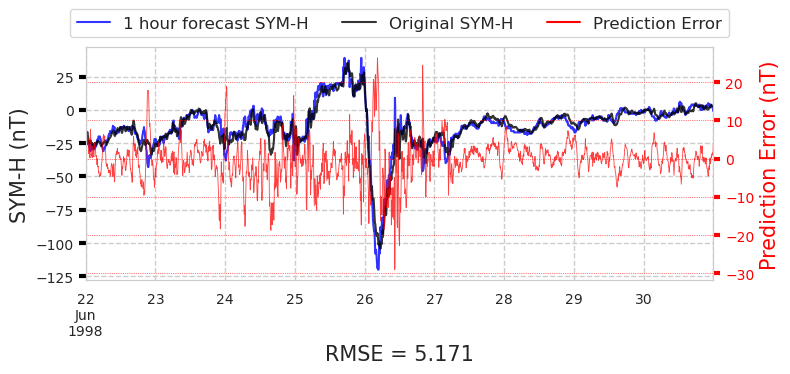

Plot for storm 27


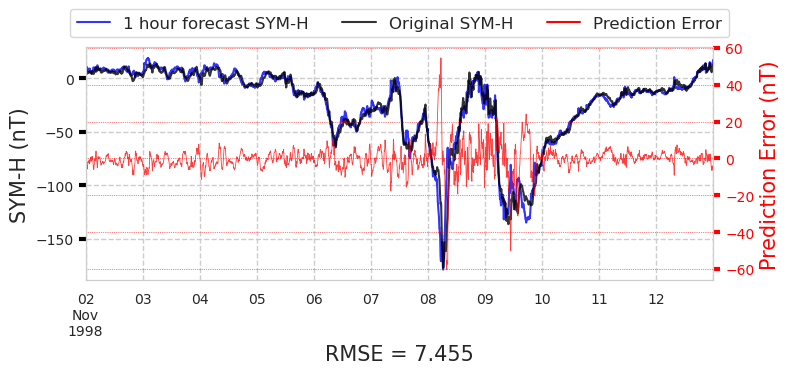

Plot for storm 28


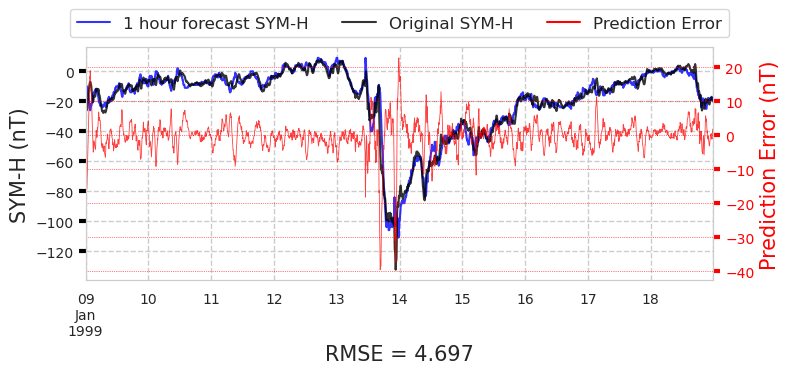

Plot for storm 29


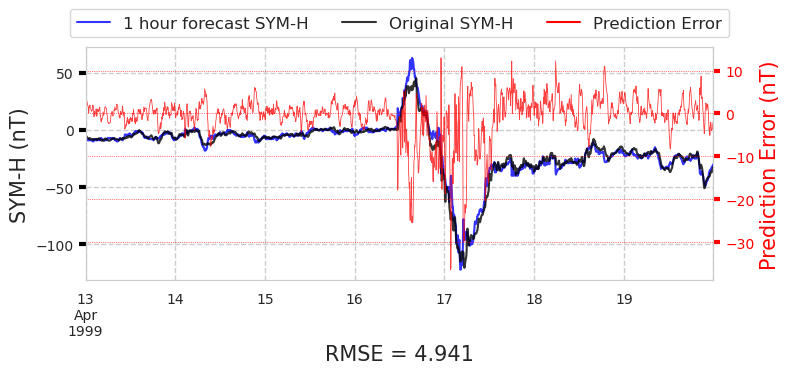

Plot for storm 30


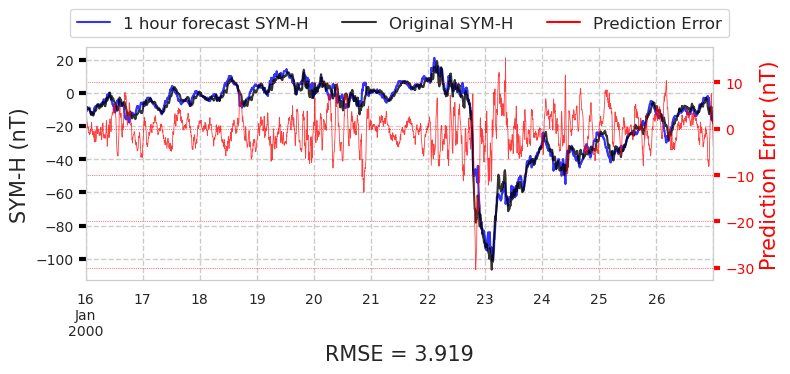

Plot for storm 31


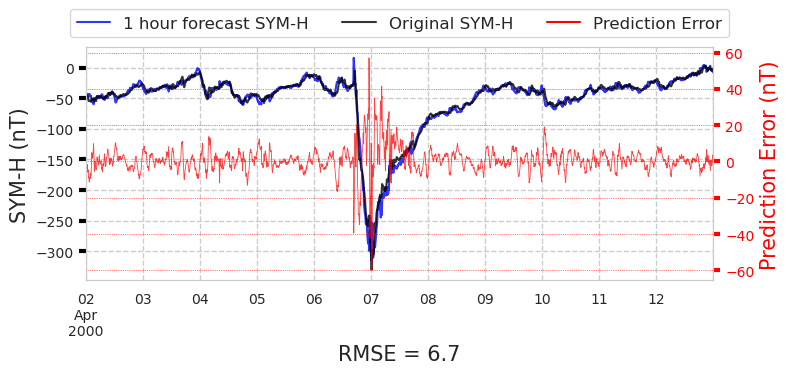

Plot for storm 32


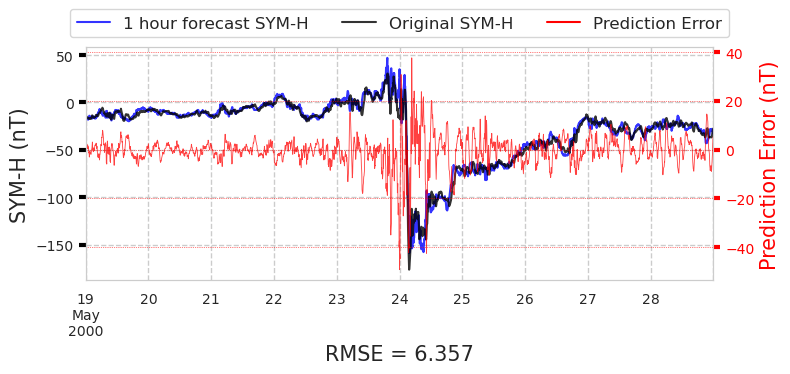

Plot for storm 33


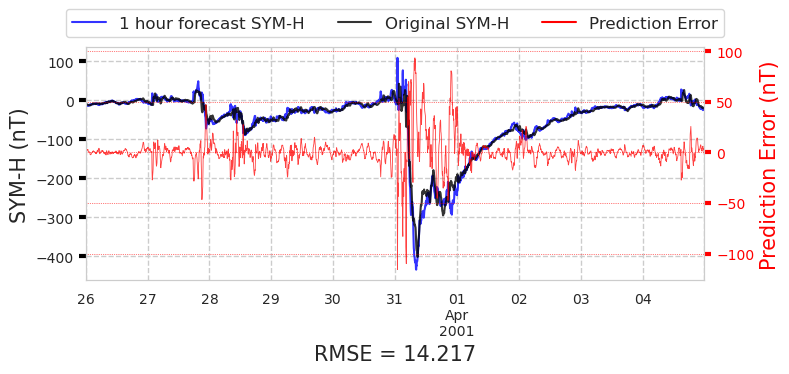

Plot for storm 34


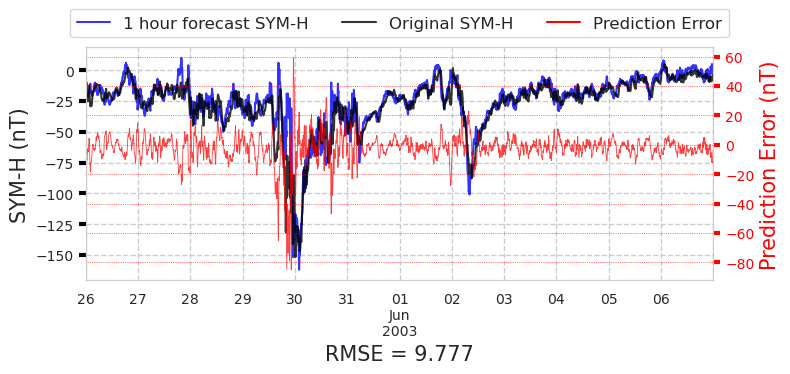

Plot for storm 35


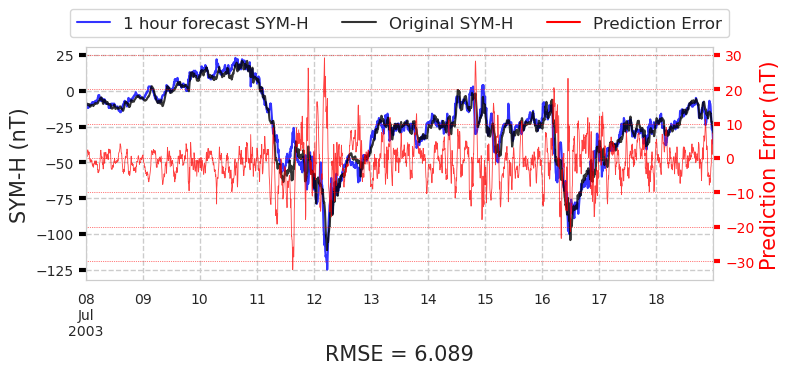

Plot for storm 36


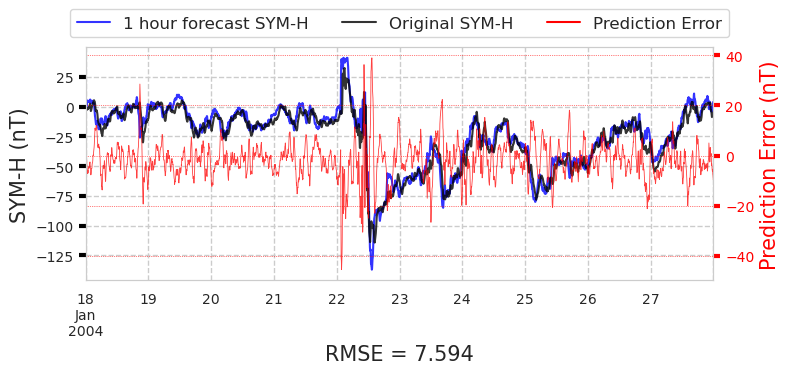

Plot for storm 37


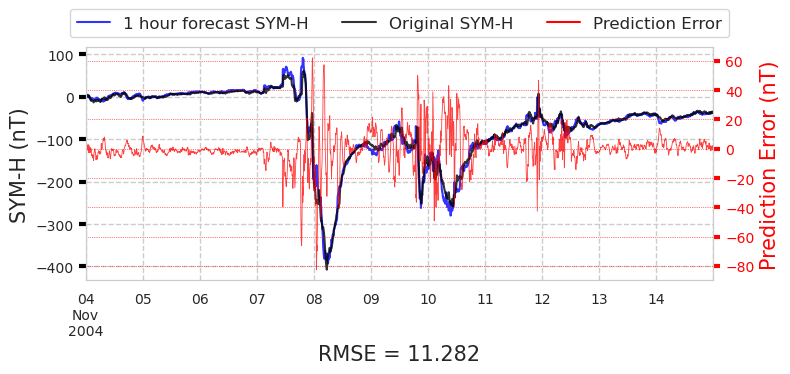

Plot for storm 38


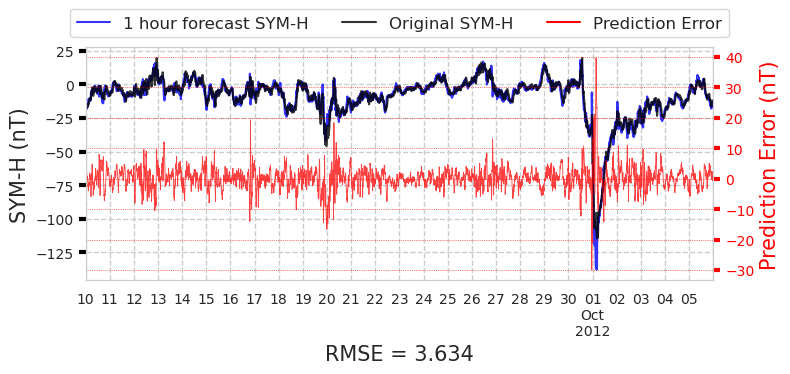

Plot for storm 39


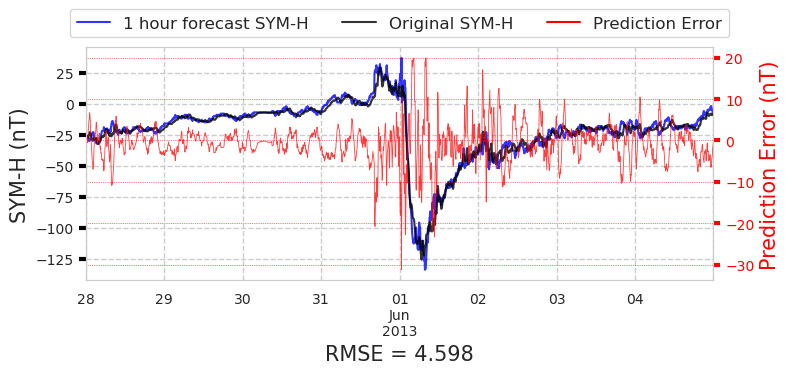

Plot for storm 40


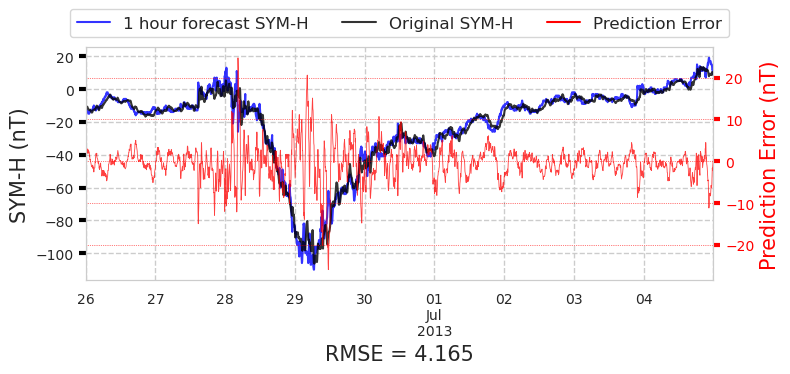

Plot for storm 41


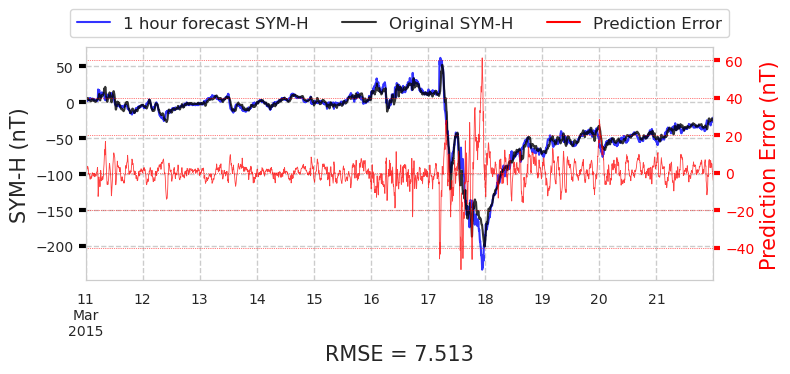

Plot for storm 42


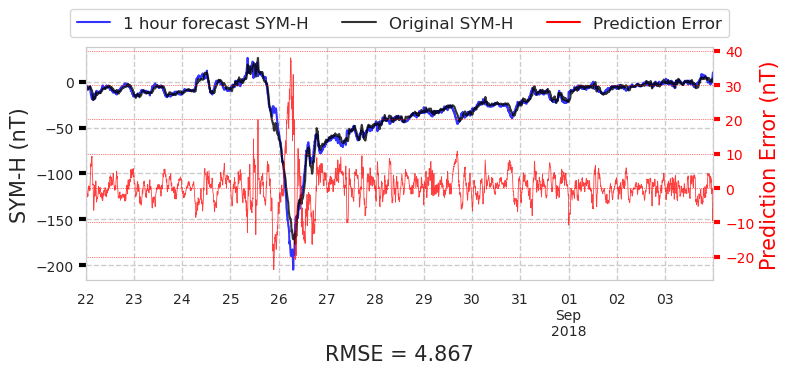

Plotting storms for the info set 1h_swics_rt
Plot for storm 26


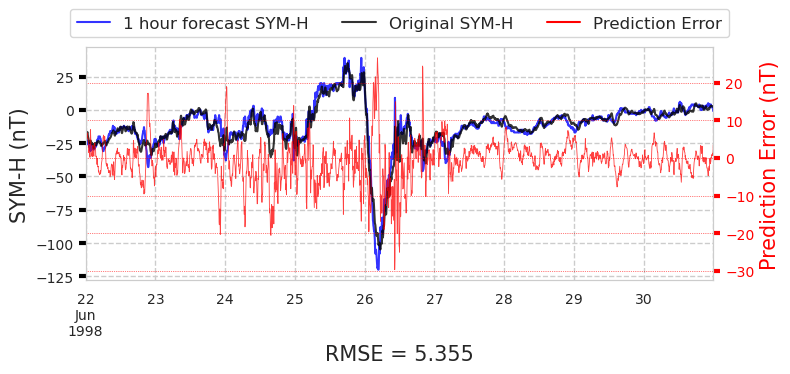

Plot for storm 27


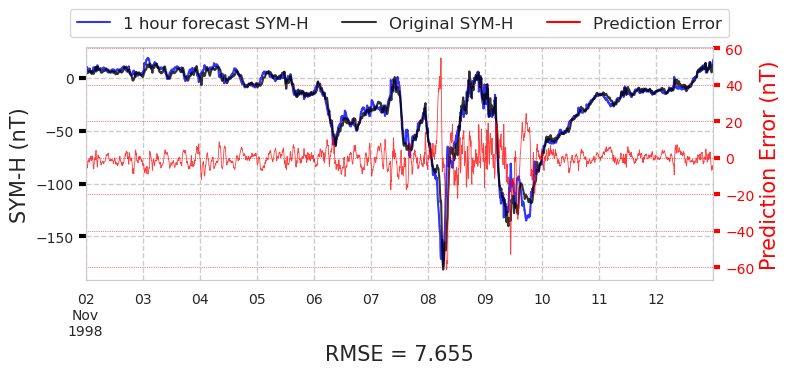

Plot for storm 28


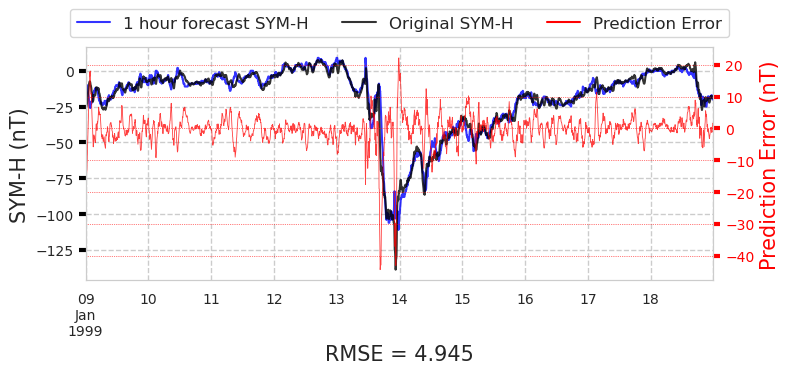

Plot for storm 29


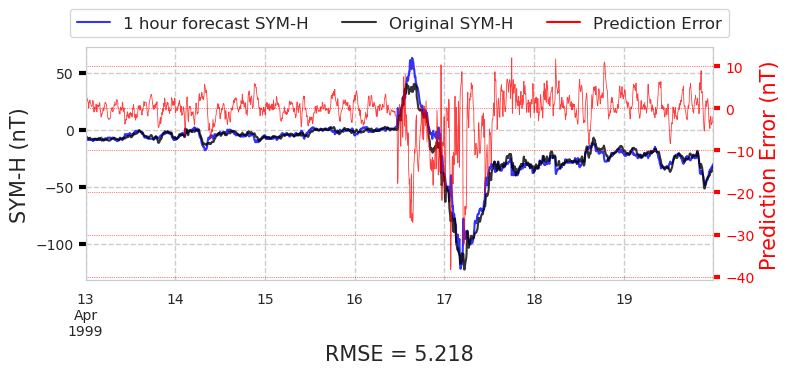

Plot for storm 30


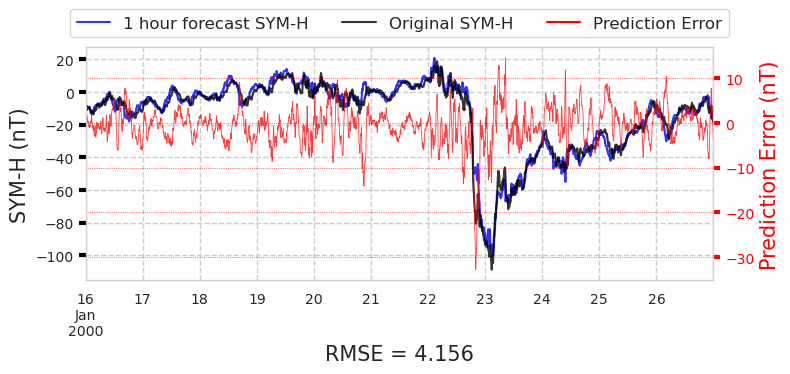

Plot for storm 31


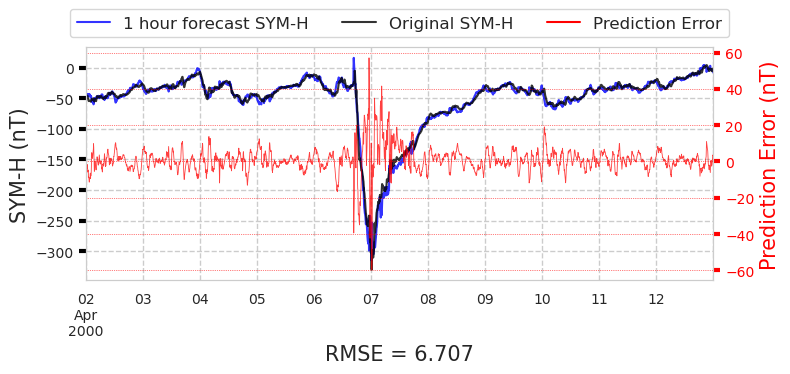

Plot for storm 32


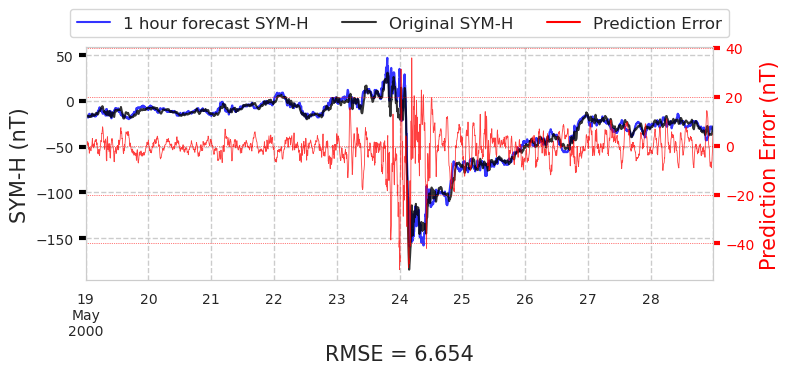

Plot for storm 33


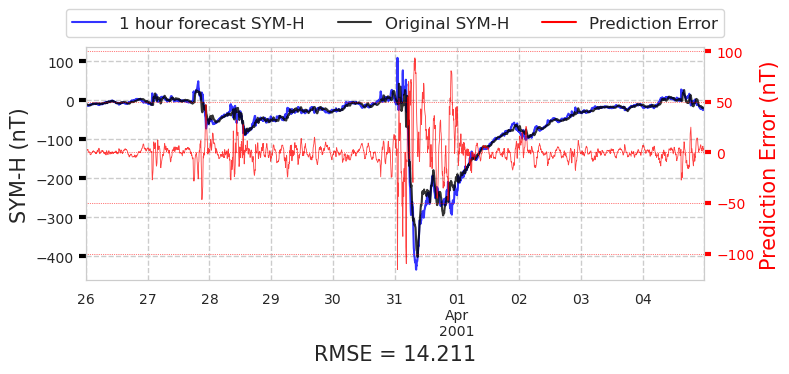

Plot for storm 34


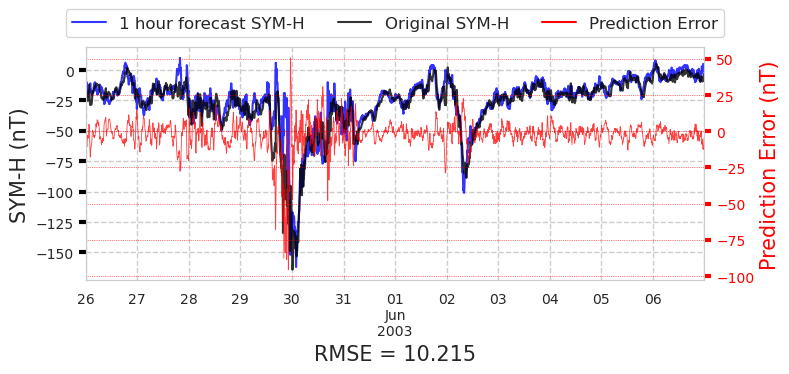

Plot for storm 35


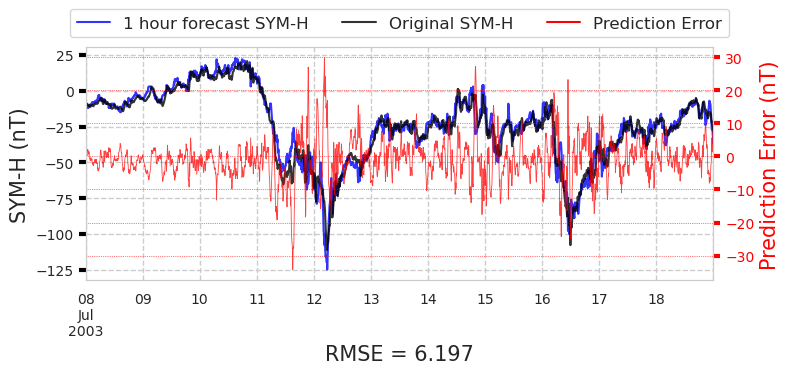

Plot for storm 36


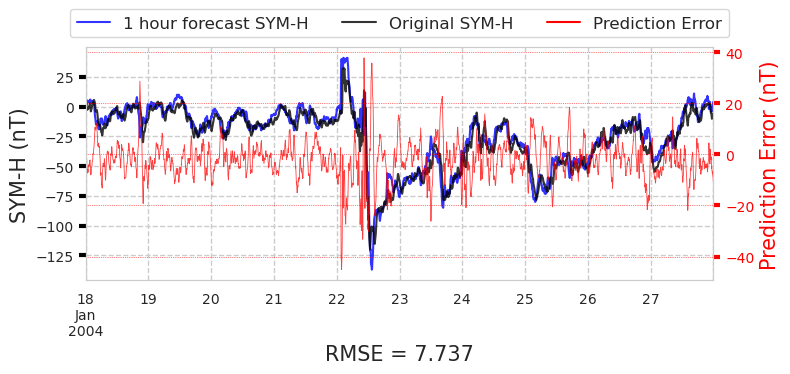

Plot for storm 37


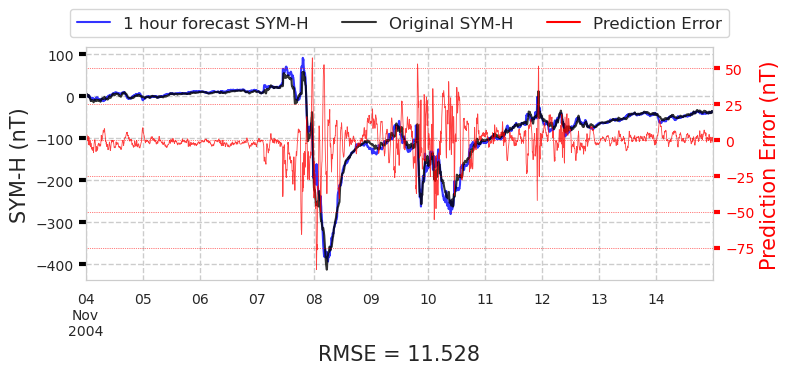

Plot for storm 38


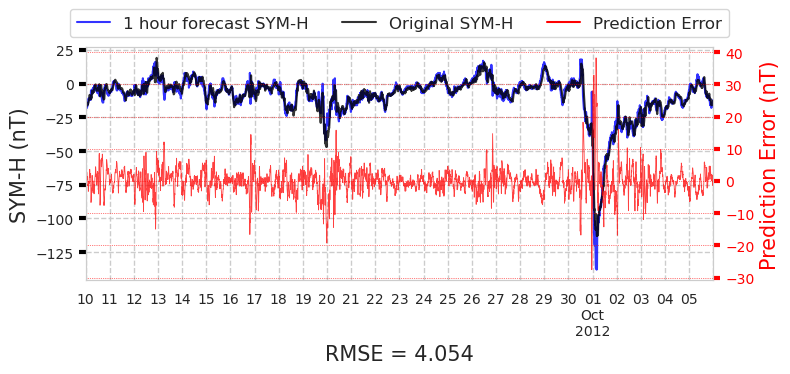

Plot for storm 39


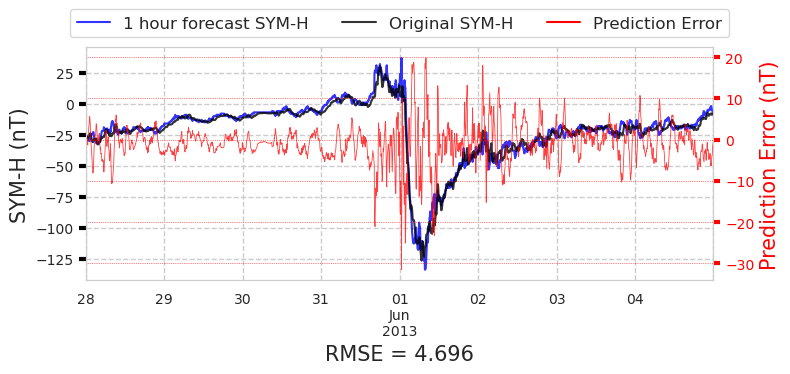

Plot for storm 40


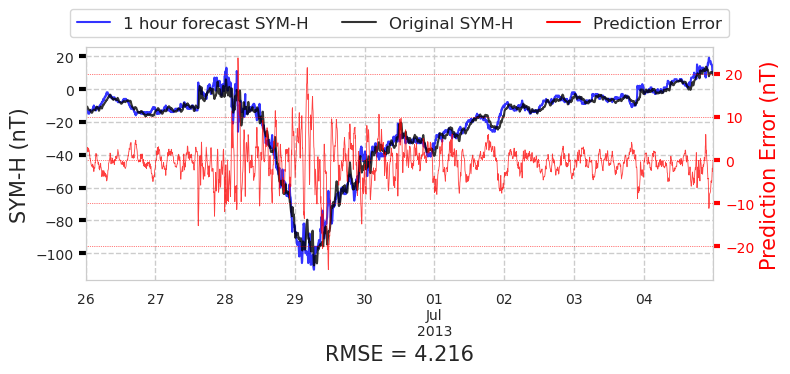

Plot for storm 41


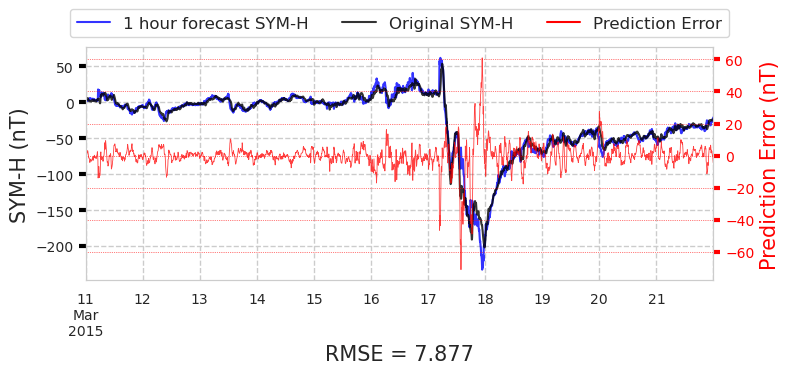

Plot for storm 42


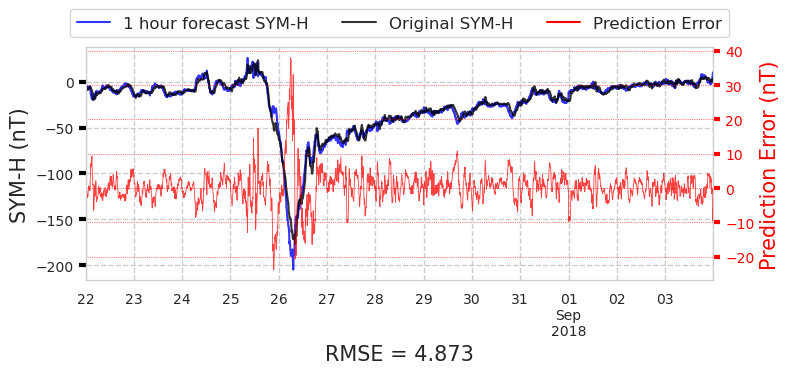

Plotting storms for the info set 1h_swepam_rt
Plot for storm 26


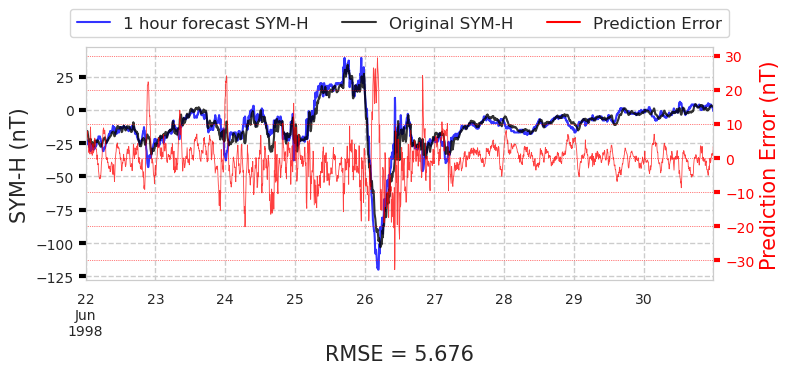

Plot for storm 27


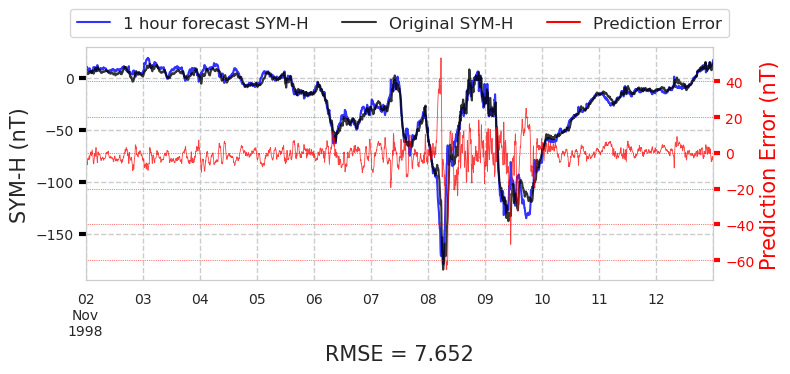

Plot for storm 28


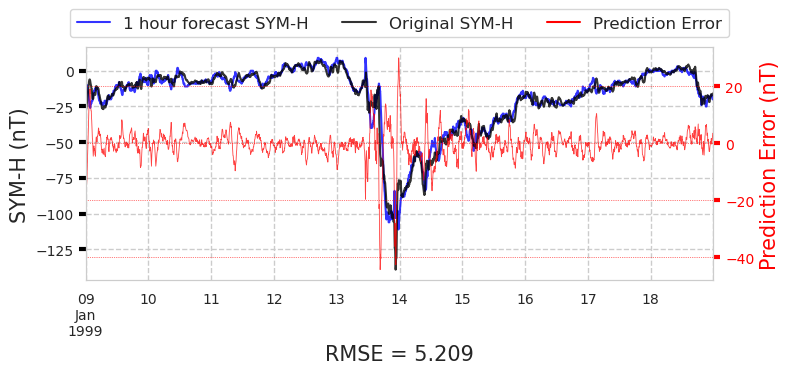

Plot for storm 29


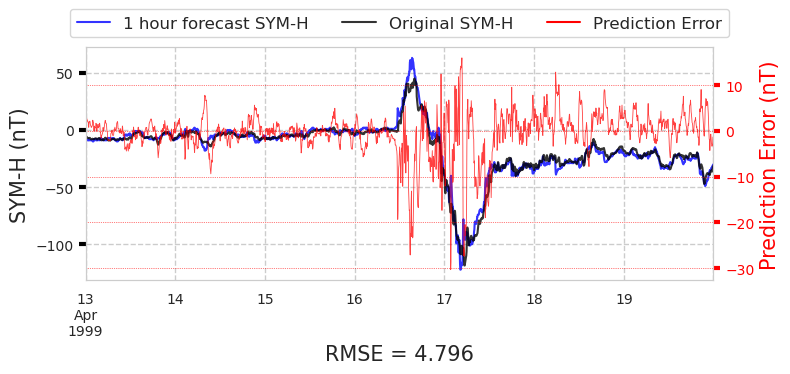

Plot for storm 30


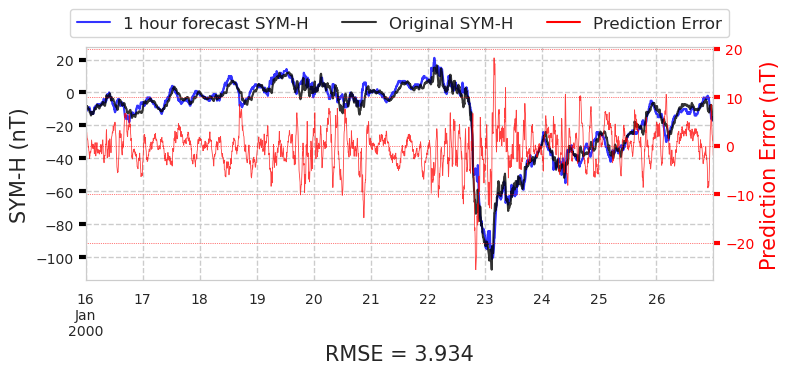

Plot for storm 31


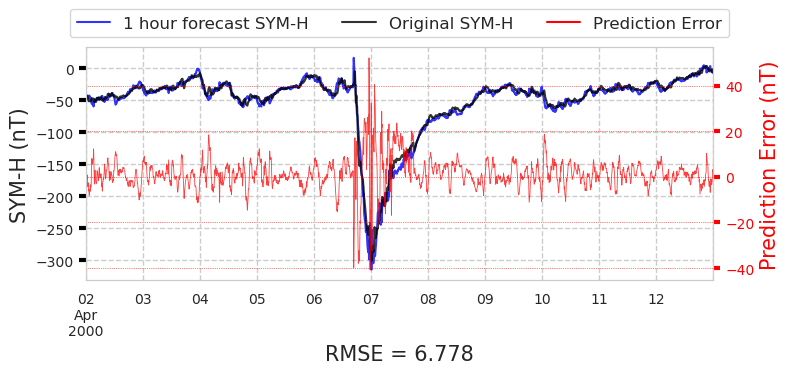

Plot for storm 32


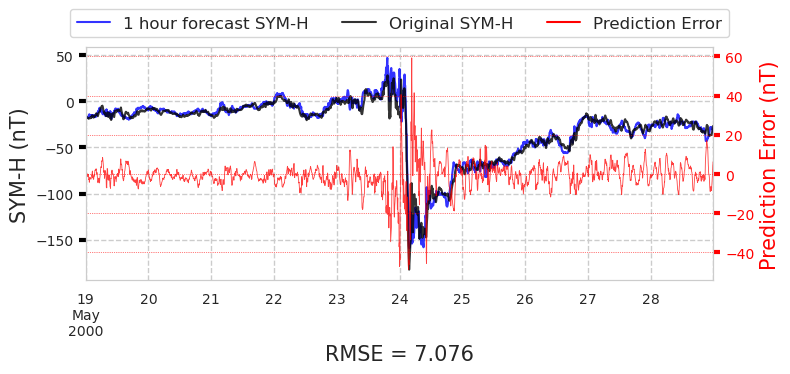

Plot for storm 33


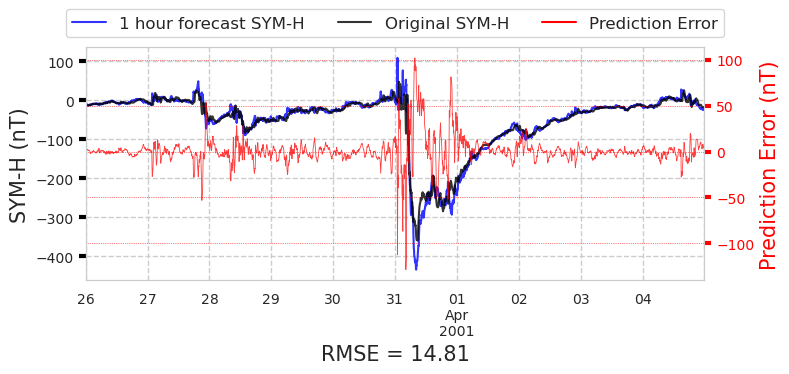

Plot for storm 34


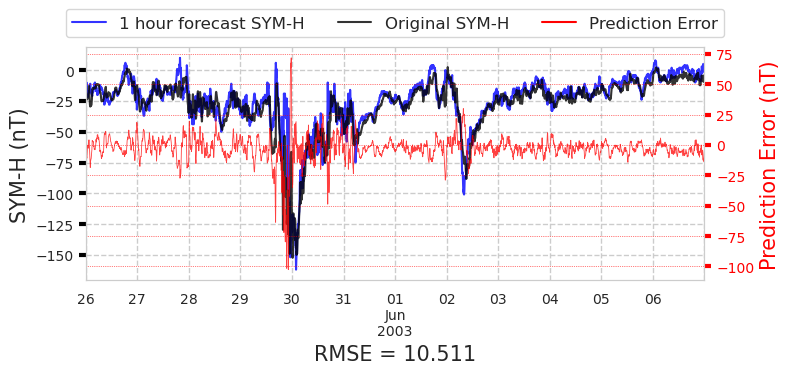

Plot for storm 35


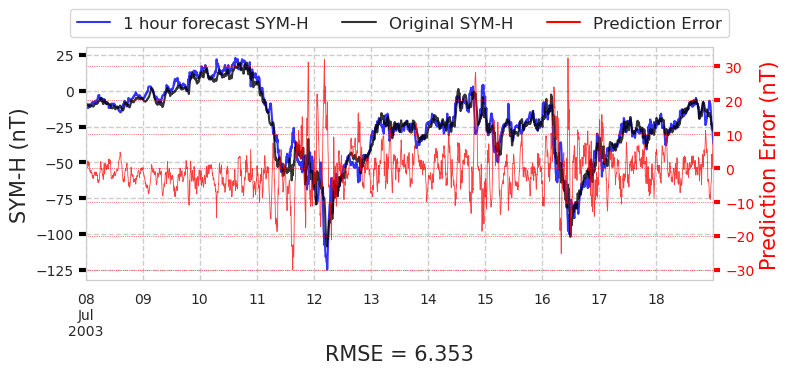

Plot for storm 36


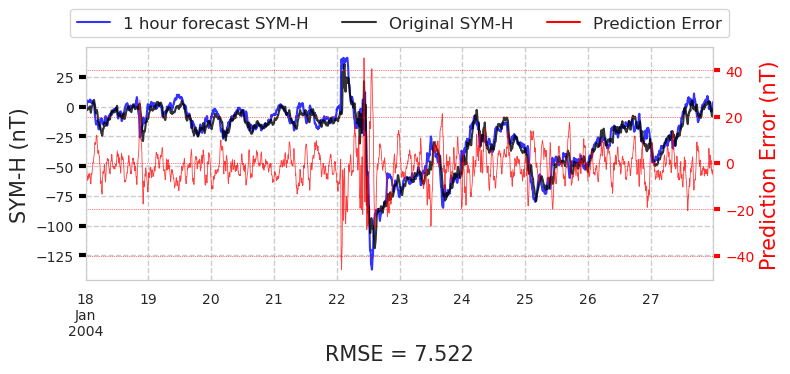

Plot for storm 37


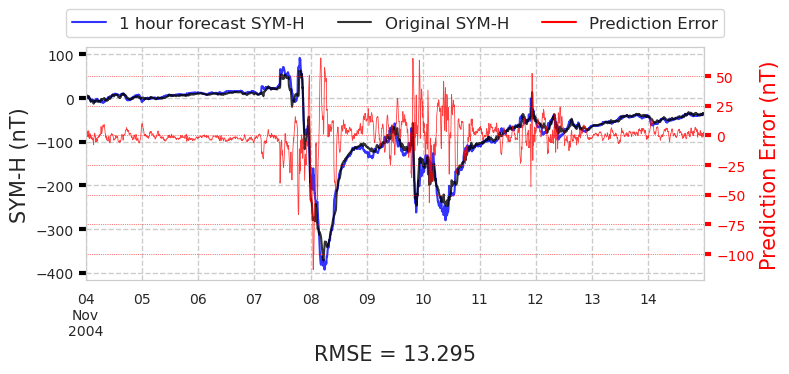

Plot for storm 38


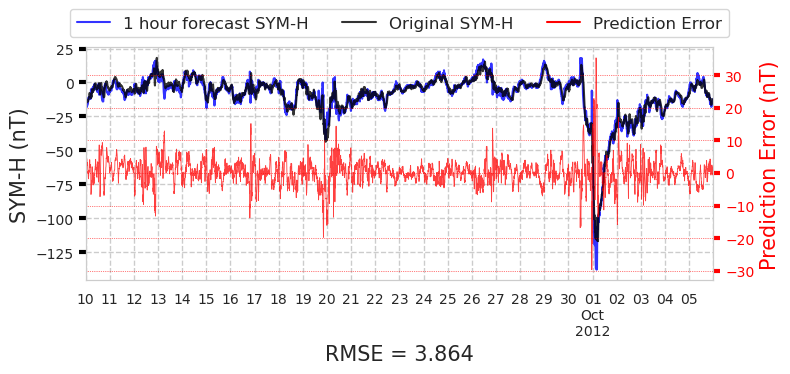

Plot for storm 39


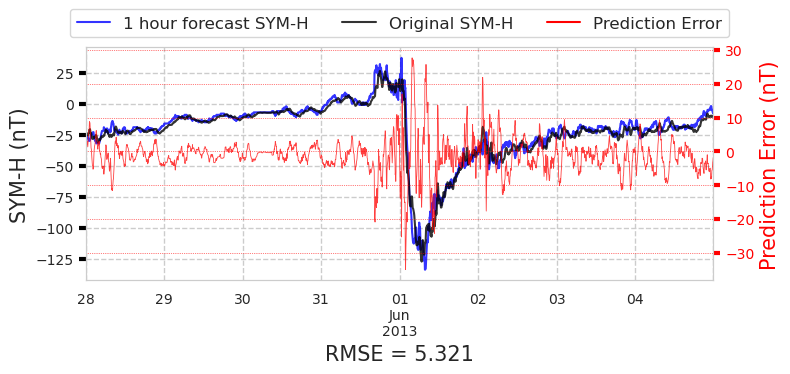

Plot for storm 40


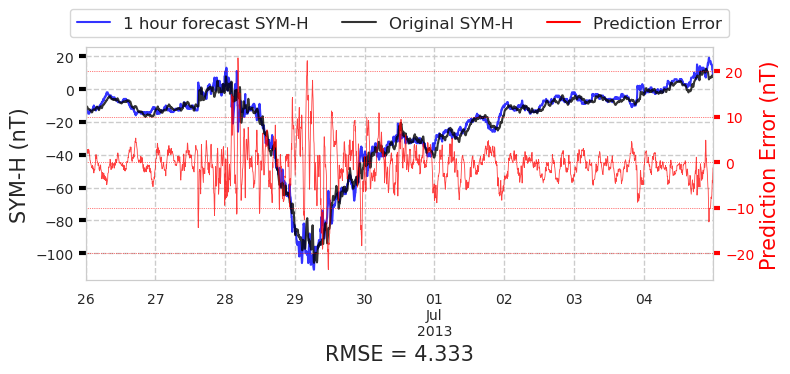

Plot for storm 41


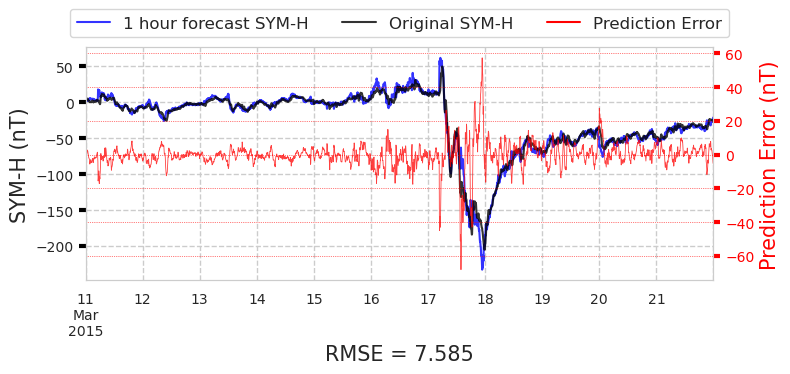

Plot for storm 42


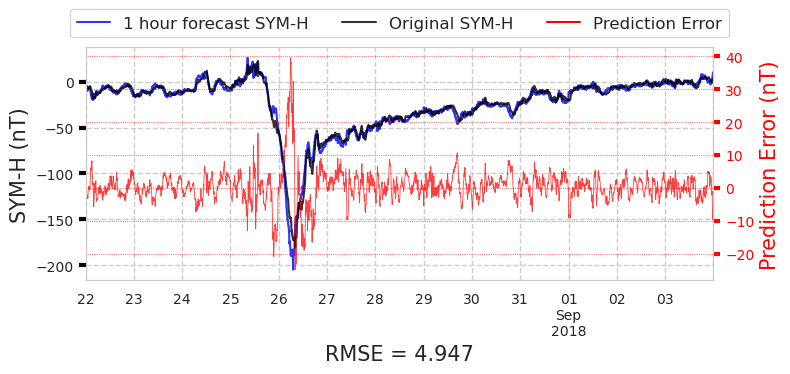

Plotting storms for the info set 2h_swics
Plot for storm 26


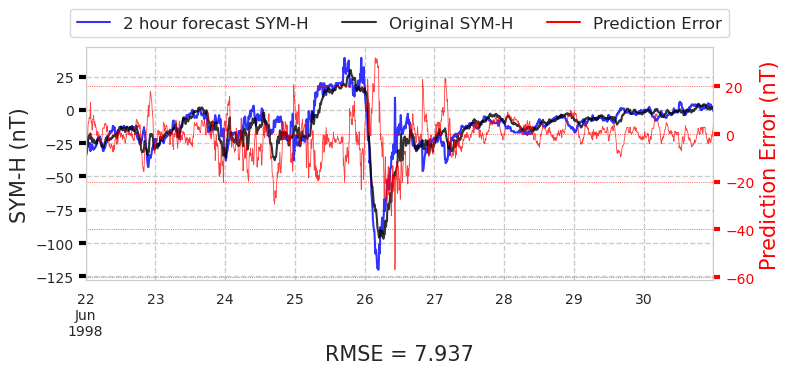

Plot for storm 27


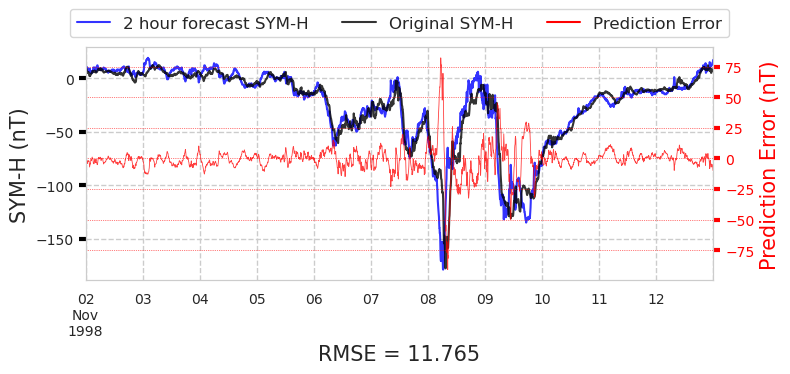

Plot for storm 28


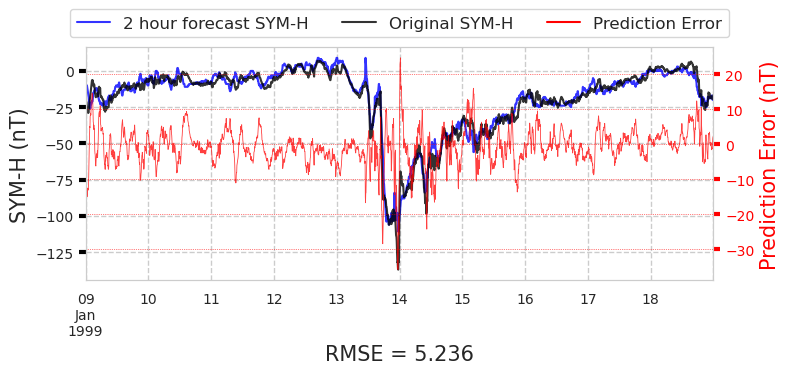

Plot for storm 29


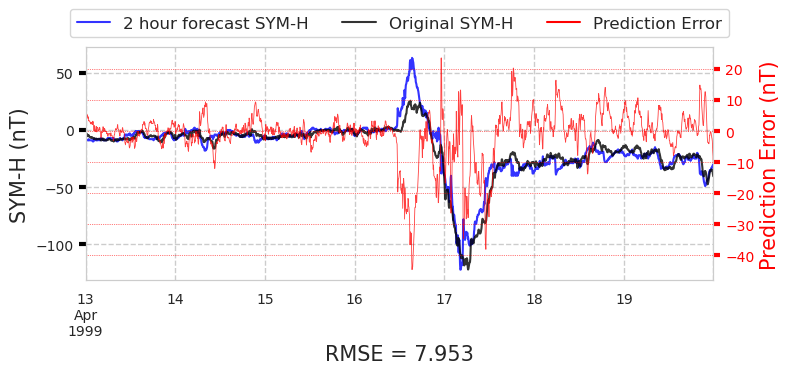

Plot for storm 30


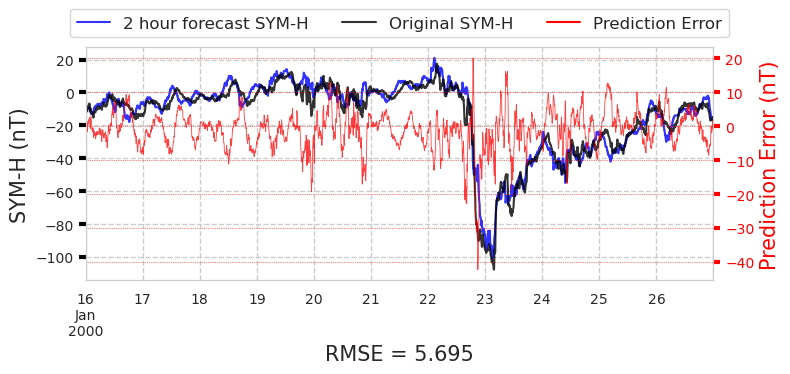

Plot for storm 31


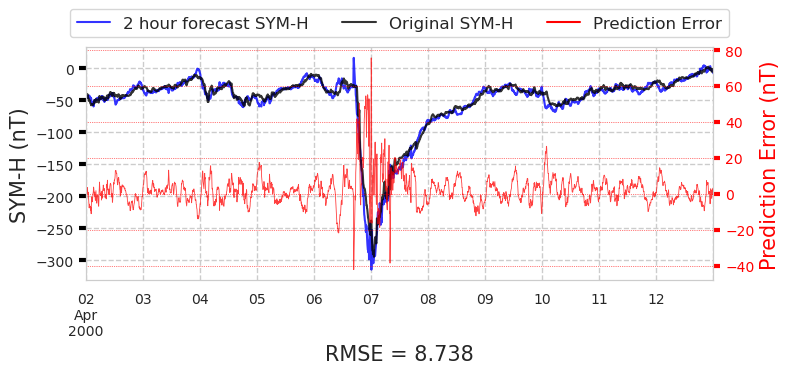

Plot for storm 32


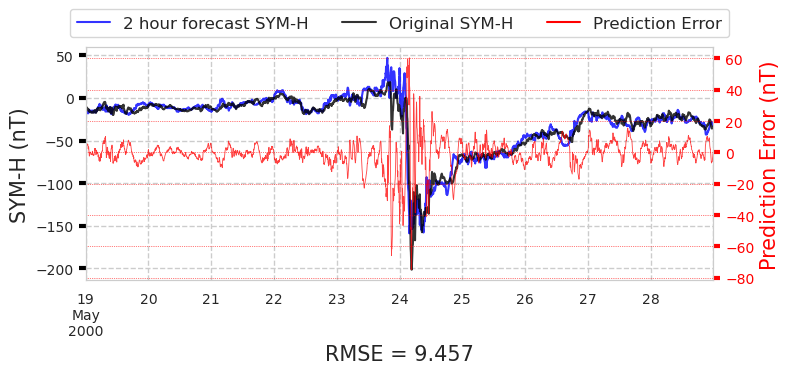

Plot for storm 33


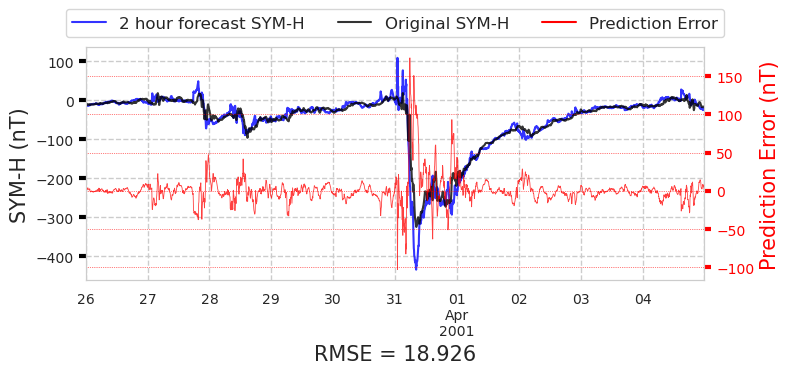

Plot for storm 34


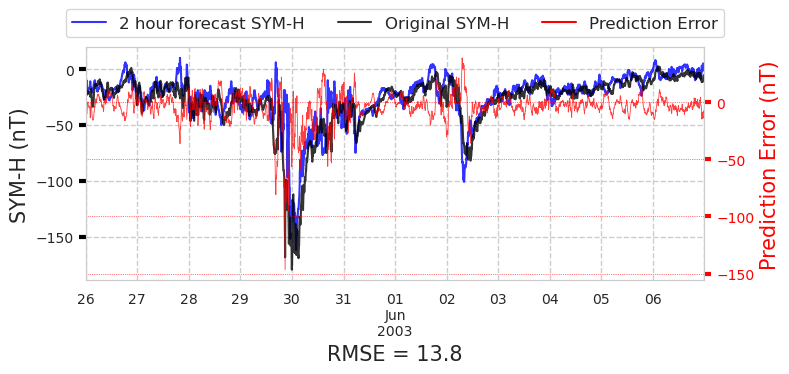

Plot for storm 35


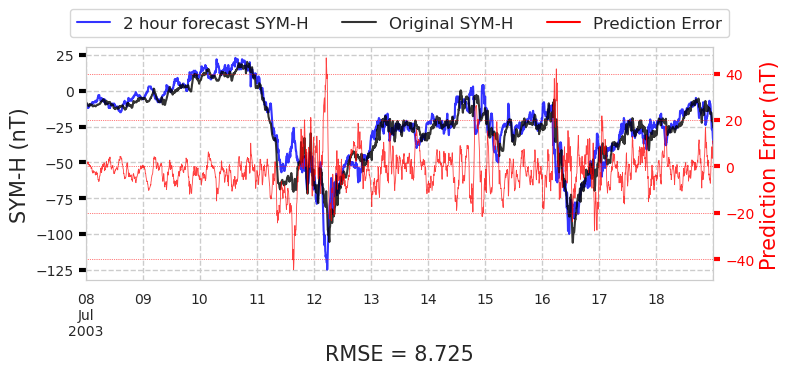

Plot for storm 36


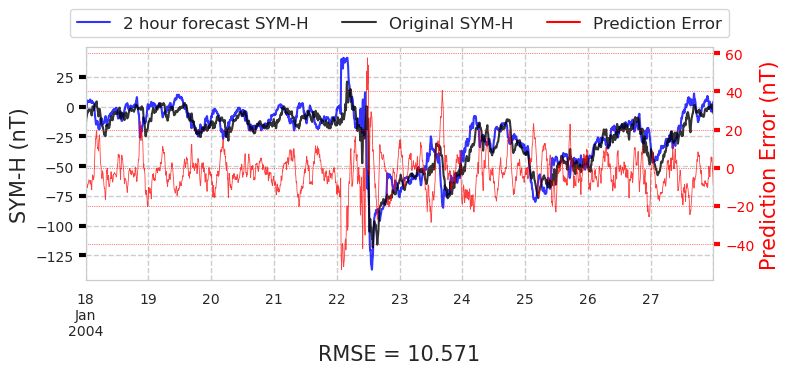

Plot for storm 37


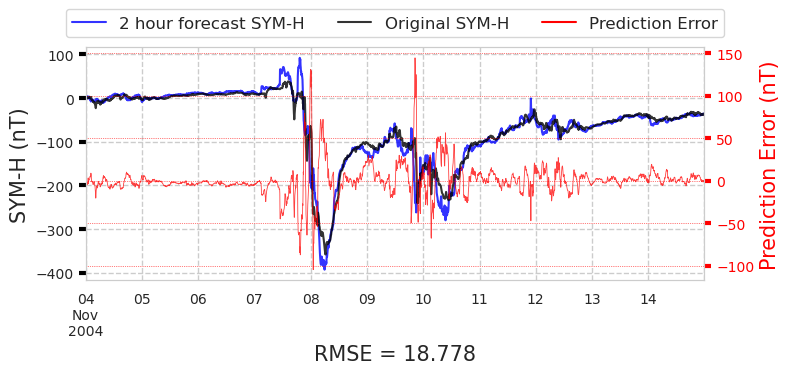

Plot for storm 38


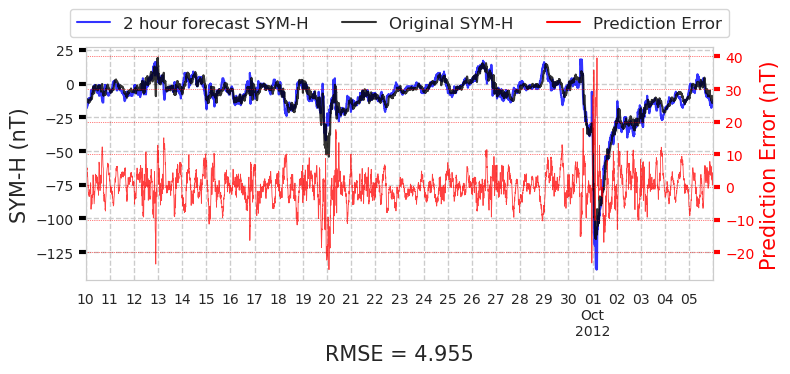

Plot for storm 39


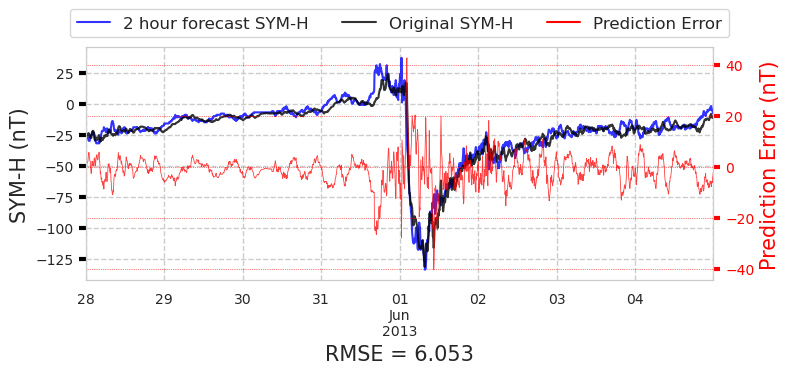

Plot for storm 40


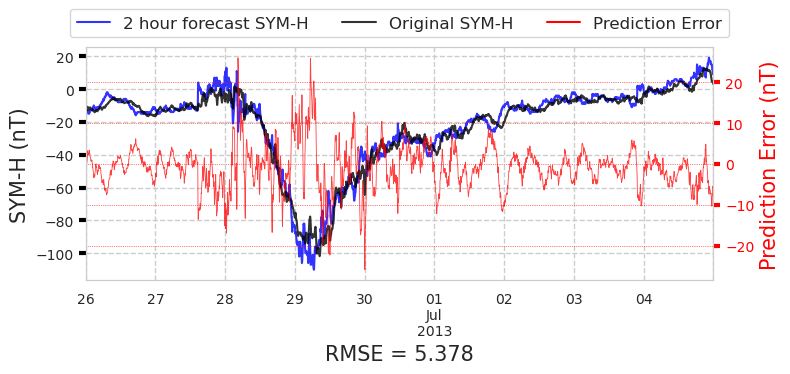

Plot for storm 41


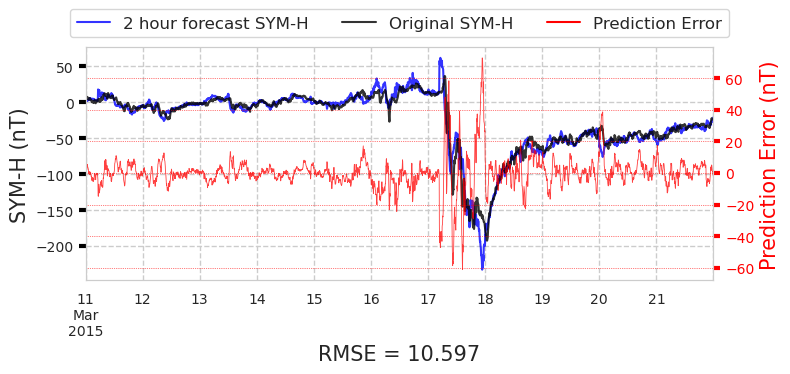

Plot for storm 42


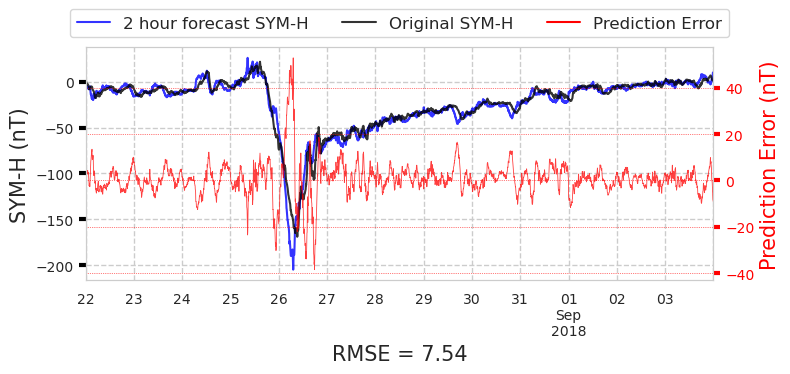

Plotting storms for the info set 2h_swics_rt
Plot for storm 26


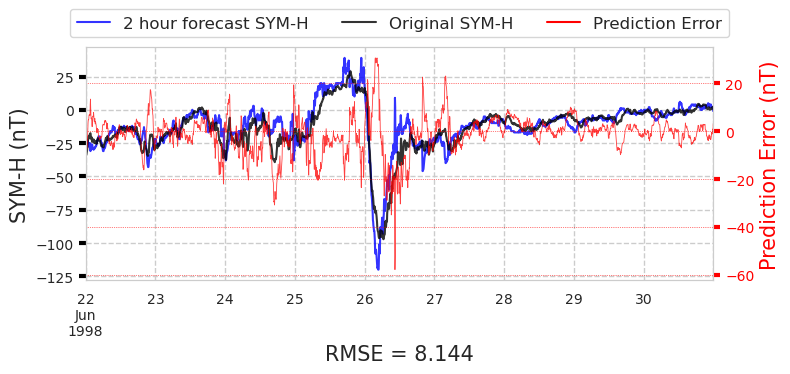

Plot for storm 27


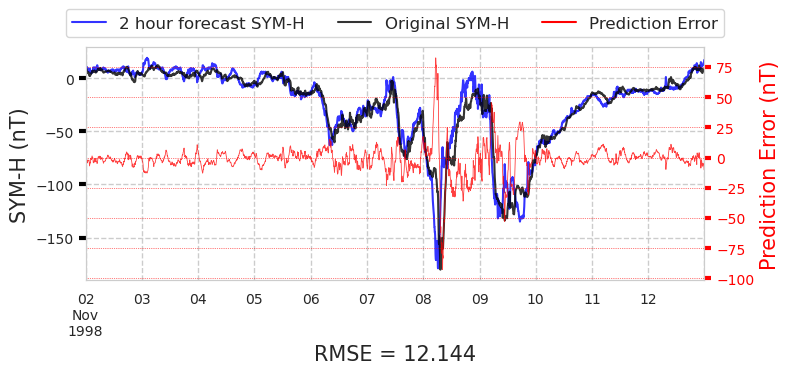

Plot for storm 28


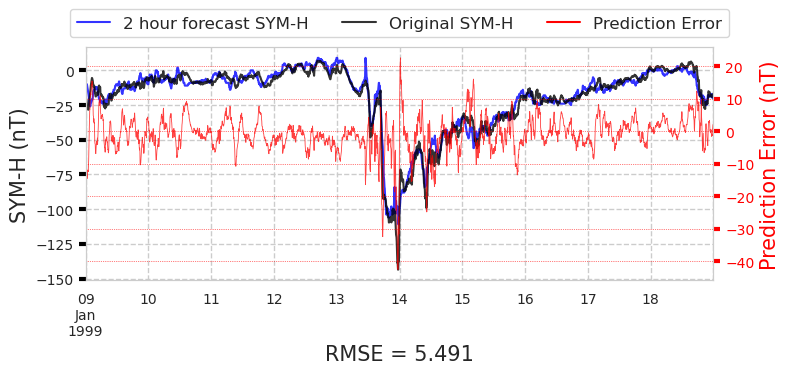

Plot for storm 29


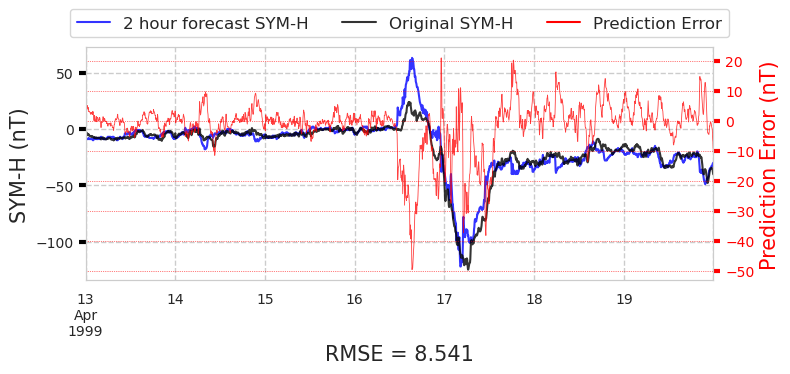

Plot for storm 30


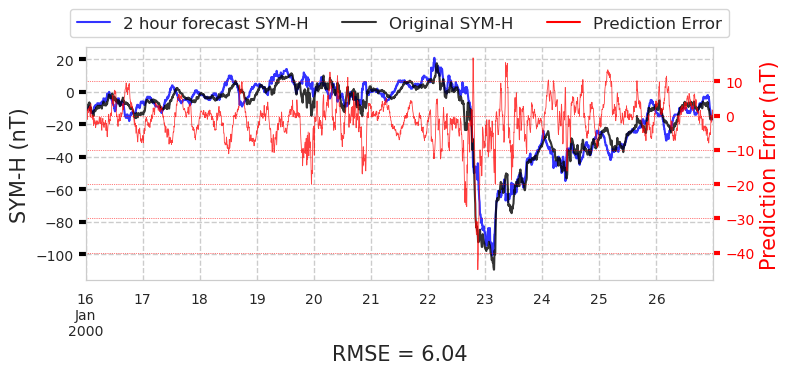

Plot for storm 31


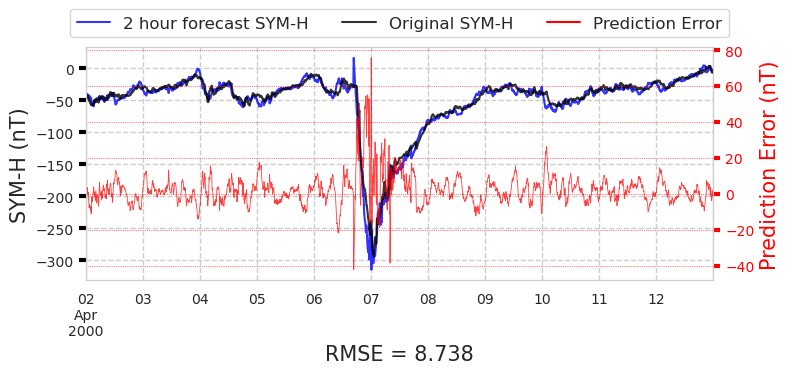

Plot for storm 32


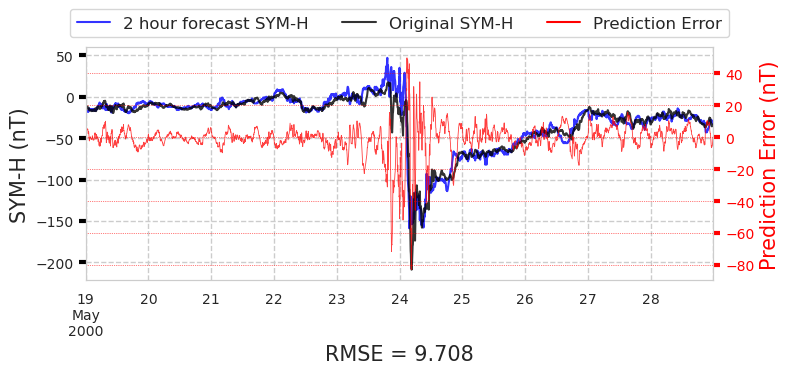

Plot for storm 33


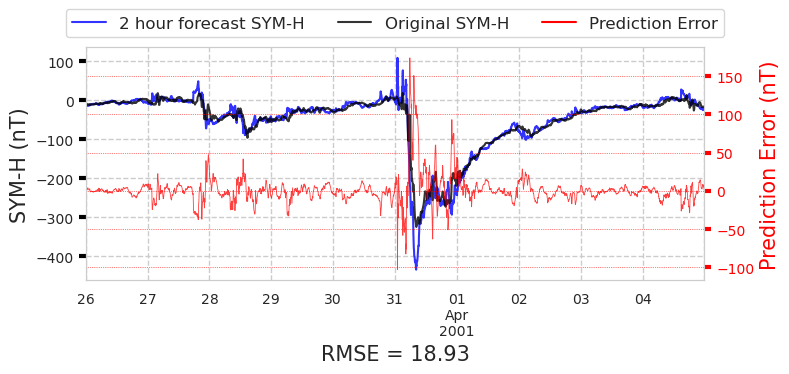

Plot for storm 34


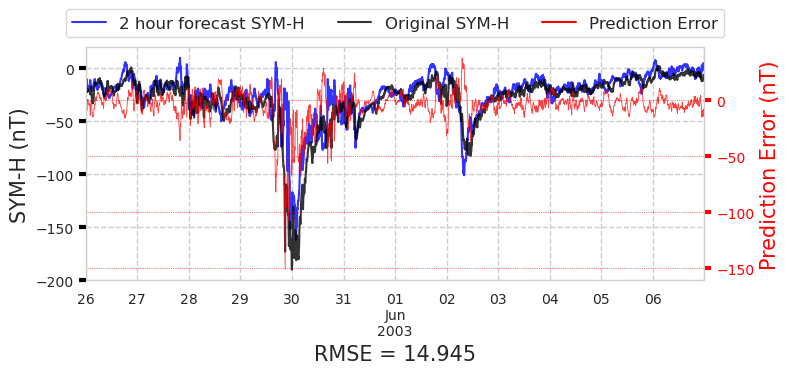

Plot for storm 35


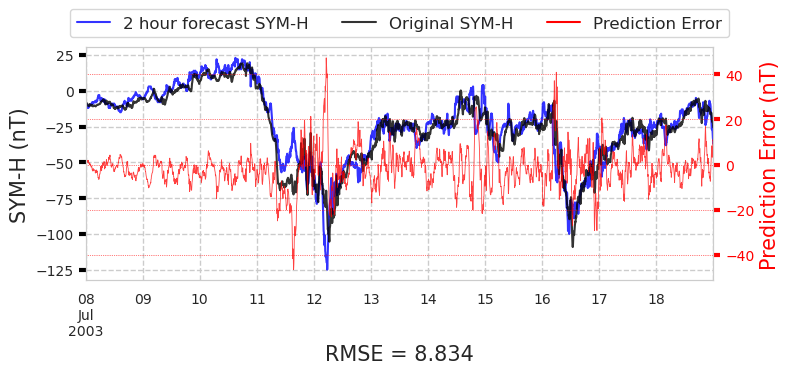

Plot for storm 36


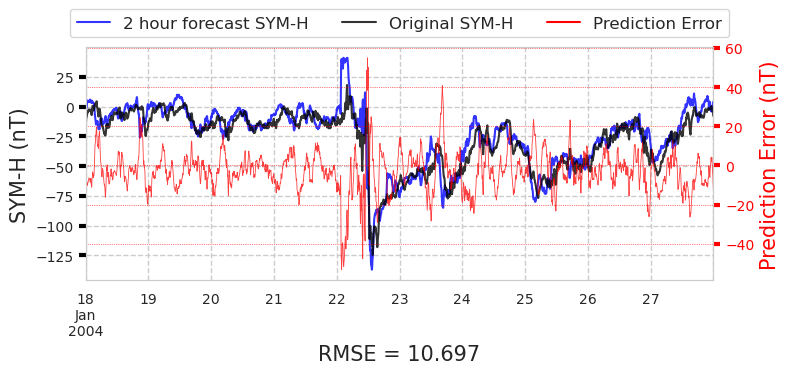

Plot for storm 37


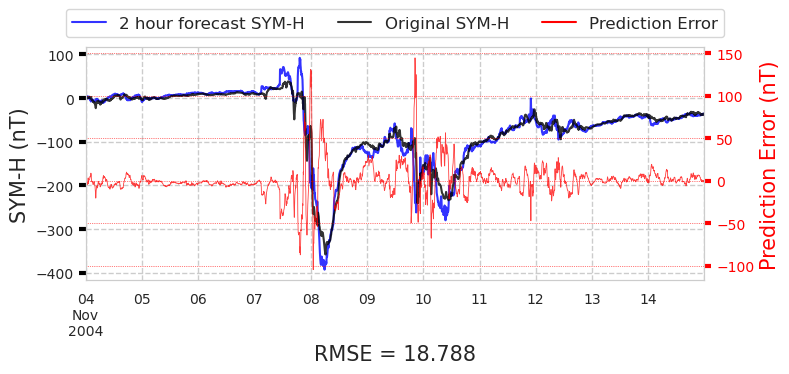

Plot for storm 38


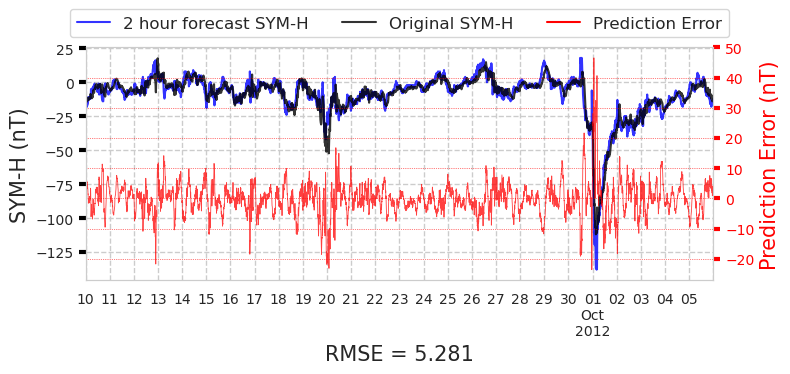

Plot for storm 39


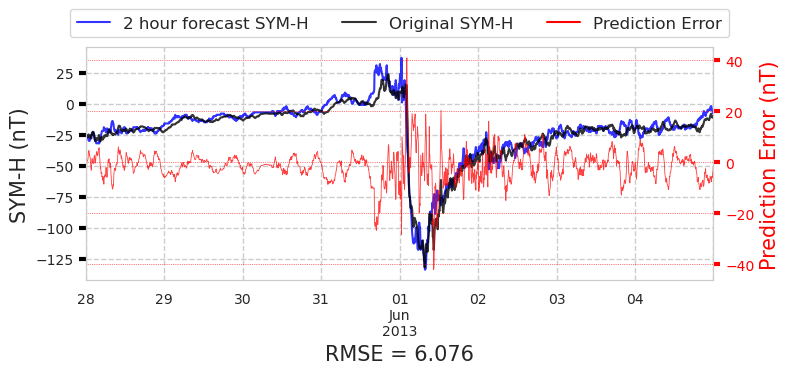

Plot for storm 40


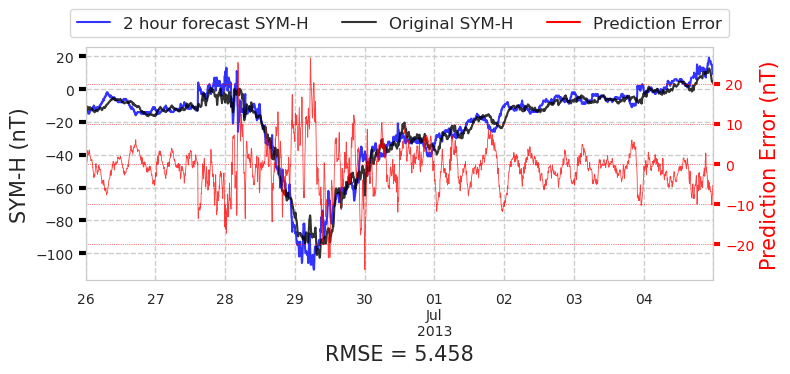

Plot for storm 41


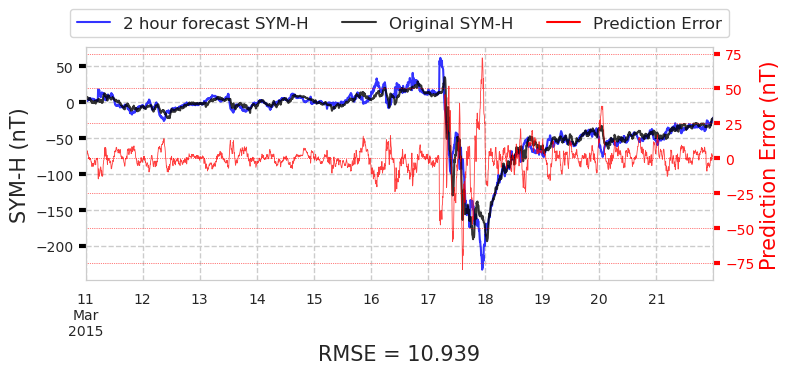

Plot for storm 42


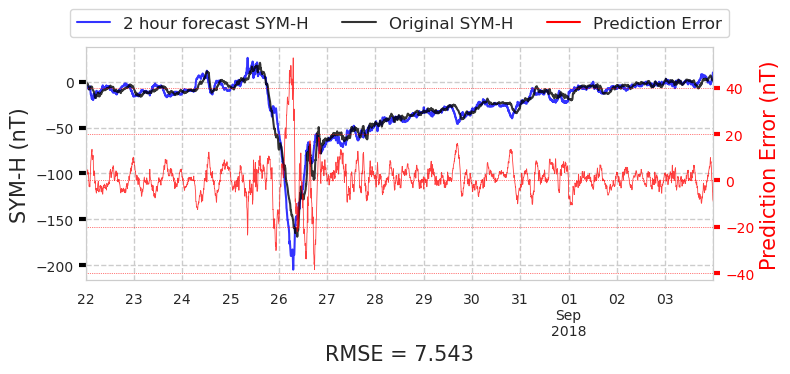

Plotting storms for the info set 2h_swepam_rt
Plot for storm 26


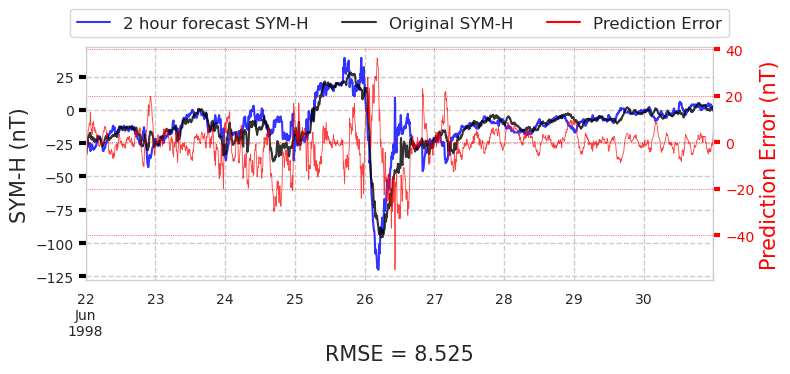

Plot for storm 27


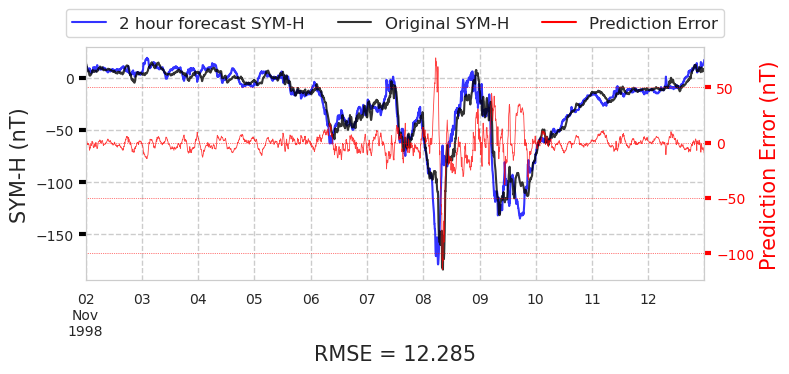

Plot for storm 28


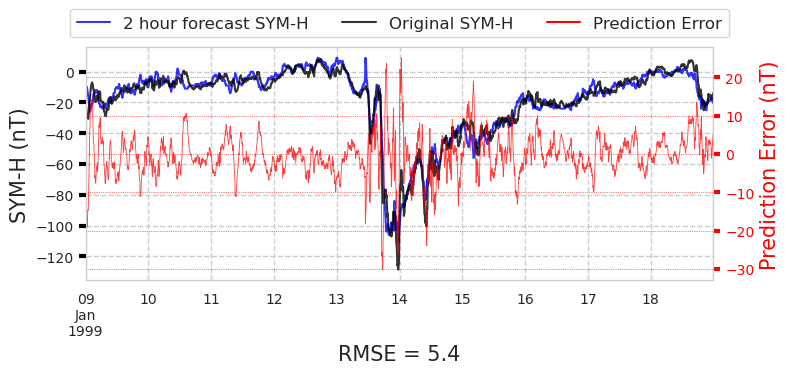

Plot for storm 29


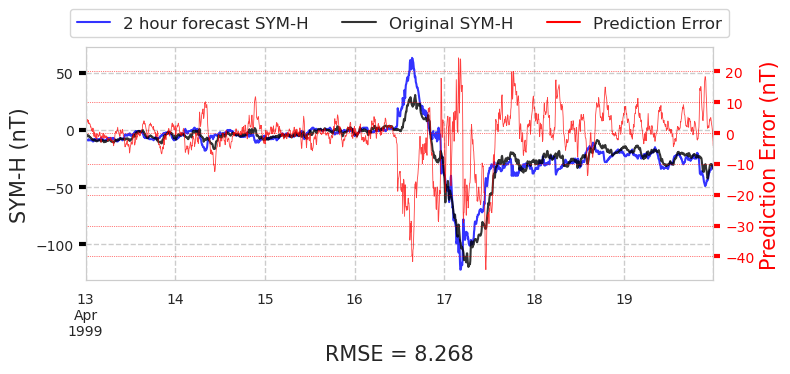

Plot for storm 30


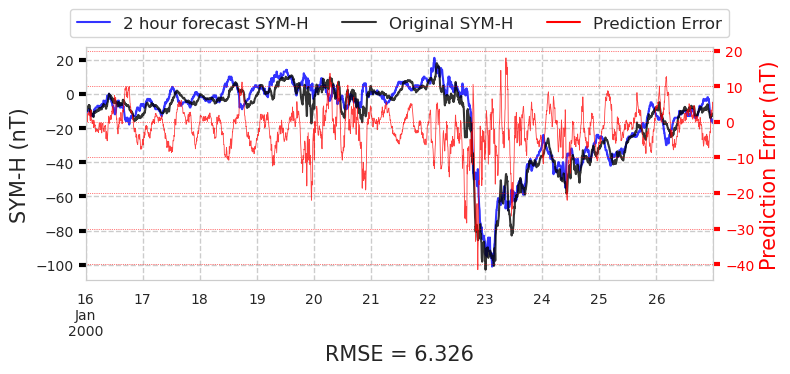

Plot for storm 31


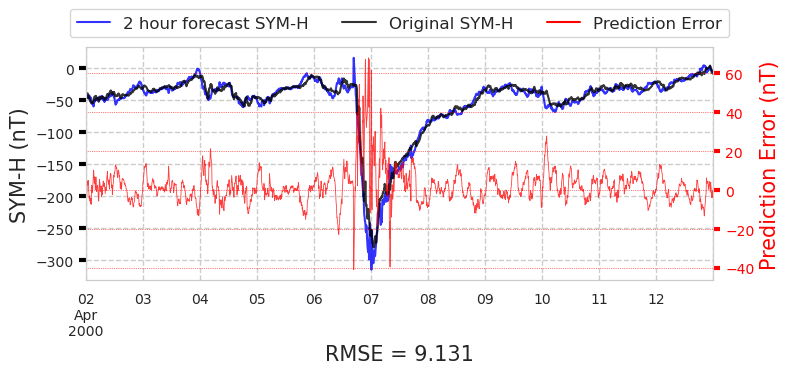

Plot for storm 32


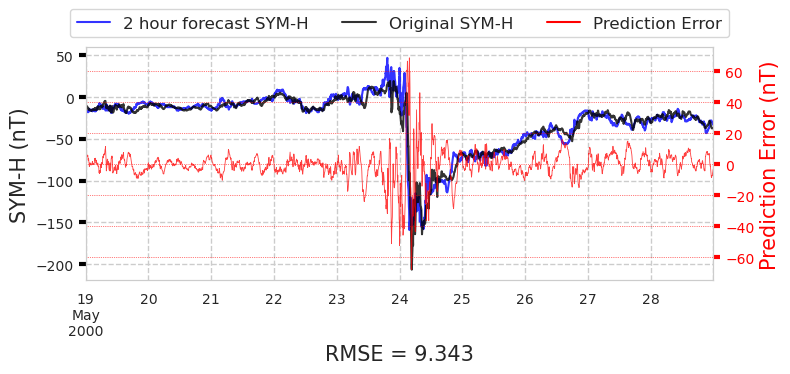

Plot for storm 33


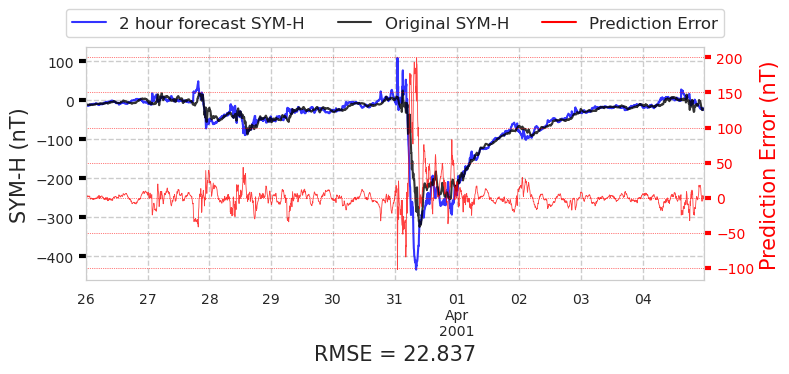

Plot for storm 34


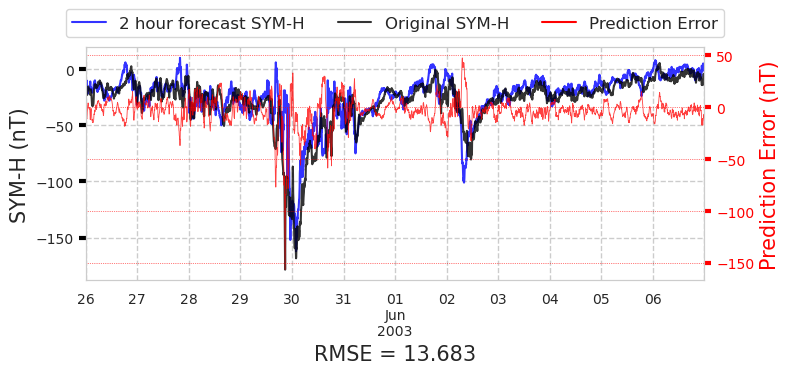

Plot for storm 35


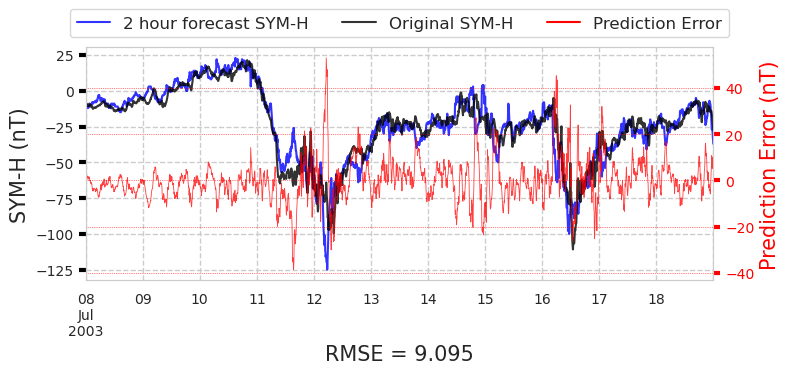

Plot for storm 36


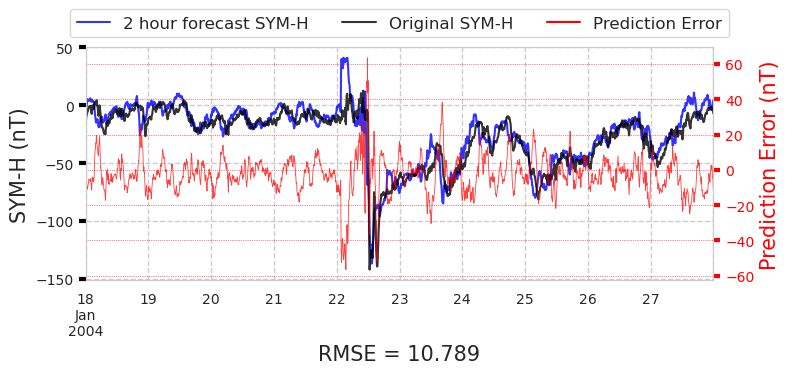

Plot for storm 37


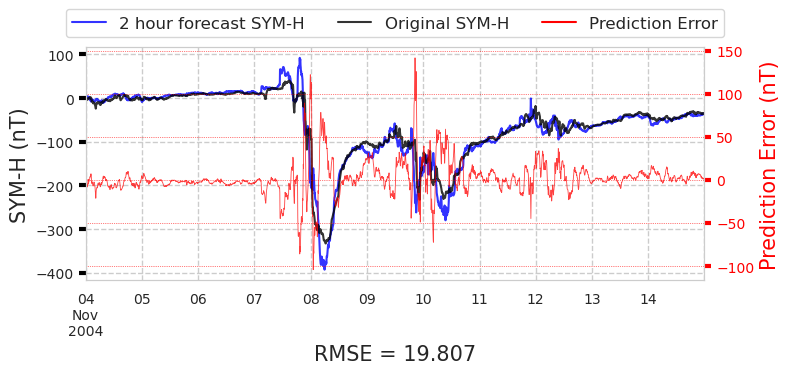

Plot for storm 38


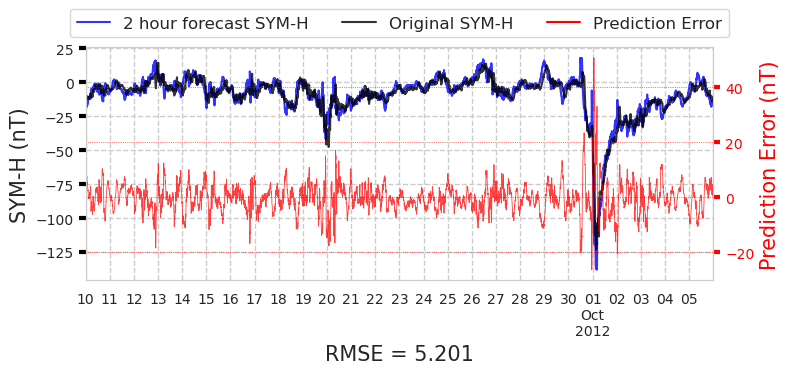

Plot for storm 39


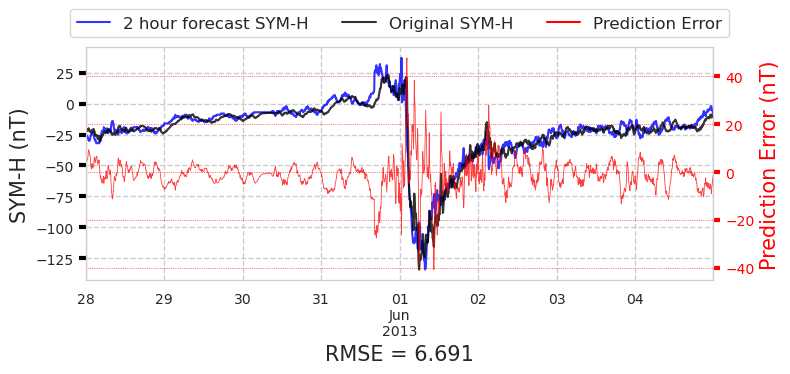

Plot for storm 40


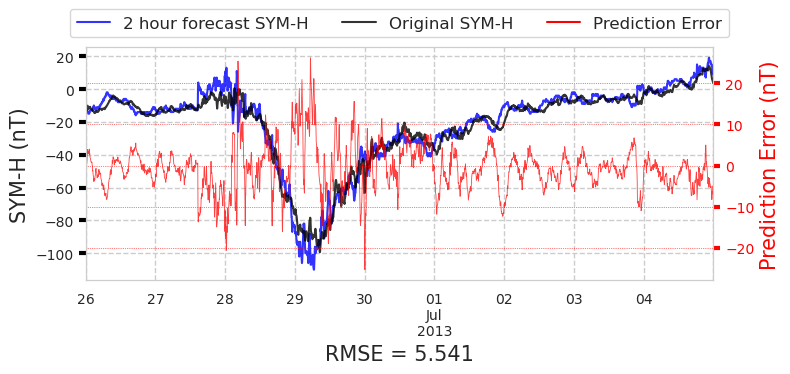

Plot for storm 41


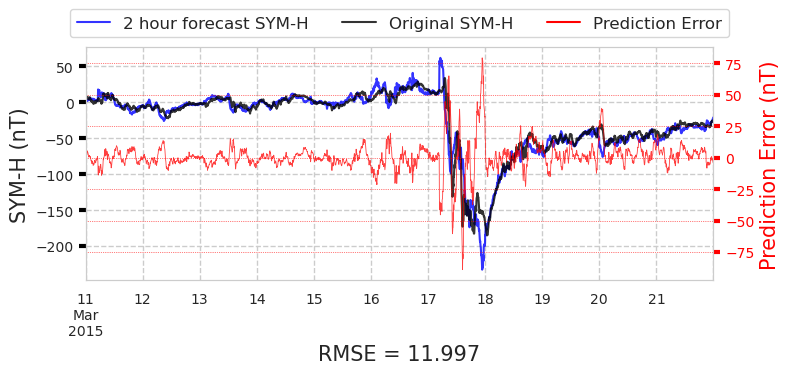

Plot for storm 42


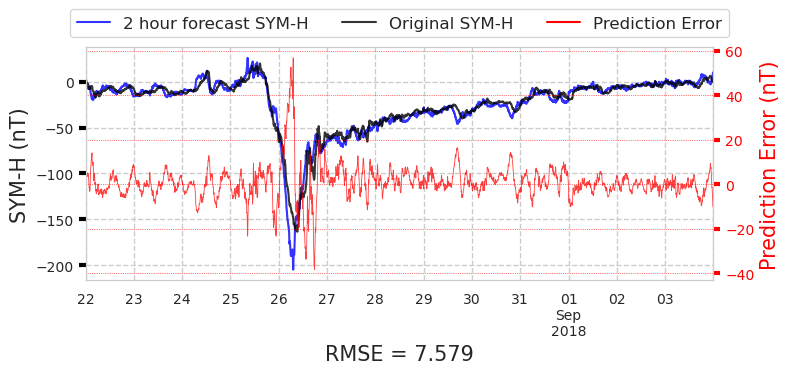

In [13]:
column_pairs = [
    (df_60_swics, 'original_SYM_H-t0', 'predicted_SYM_H_1h_swics', "1 hour forecast SYM-H", 
     '1h_swics', 'Model trained with SWEPAM and SWICS'),
    (df_60_swics_rt, 'original_SYM_H-t0', 'predicted_SYM_H_1h_real_time', "1 hour forecast SYM-H", 
     '1h_swics_rt', 'Model trained with SWICS evaluated in an operational scenario',),
    (df_60_swepam_rt, 'original_SYM_H-t0', 'predicted_SYM_H_1h_real_time', "1 hour forecast SYM-H", 
     '1h_swepam_rt', 'Model trained with SWEPAM evaluated in an operational scenario',),
    (df_120_swics, 'original_SYM_H-t0', 'predicted_SYM_H_2h_swics', "2 hour forecast SYM-H", 
     '2h_swics', 'Model trained with SWEPAM and SWICS'),
    (df_120_swics_rt, 'original_SYM_H-t0', 'predicted_SYM_H_2h_real_time', "2 hour forecast SYM-H", 
     '2h_swics_rt', 'Model trained with SWICS evaluated in an operational scenario'),
    (df_120_swepam_rt, 'original_SYM_H-t0', 'predicted_SYM_H_2h_real_time', "2 hour forecast SYM-H", 
     '2h_swepam_rt', 'Model trained with SWEPAM evaluated in an operational scenario'),
]

storm_texts = []

base_path = './supporting_information/paper_plots'
os.makedirs(base_path, exist_ok = True)

for pair_index, pair in enumerate(column_pairs):

    df_eval = pair[0].copy()
    og_col = pair[1]
    pred_col = pair[2]
    pred_title = pair[3]
    save_path = pair[4]
    plot_title = pair[5]

    os.makedirs(os.path.join(base_path, save_path), exist_ok = True)
    
    print('Plotting storms for the info set', pair[4])

    for i, storm_index in enumerate(storm_indices):

        print(f'Plot for storm {storm_index}')

        df = df_eval[TEST_STORM_STARTS[i] : TEST_STORM_ENDS[i]].copy()        

        fig, ax = plt.subplots(1, 1, figsize = (8, 4))
        lin_pred = df[og_col].plot(ax = ax, color = "blue", label = pred_title, alpha = 0.8)
        lin_og = df[pred_col].plot(ax = ax, color = "black", label = "Original SYM-H", alpha = 0.8)
        ax.grid(True, linestyle="--", axis="both", which="both", linewidth=1)
        ax.tick_params(axis="y", color="black", labelsize=10, width=3, length=5)
        ax.tick_params(axis="x", color="black", which = 'both', labelsize=10, width=3, length=5)
        ax.set_ylabel('SYM-H (nT)', fontsize = 15)
        mse = np.round(msem(df[pred_col], df[og_col], squared = False), 3)
        ax.set_xlabel(f'RMSE = {mse}', fontsize = 15)
        
        if pair_index == 0:
            storm_texts.append(f'Storm Number {storm_index} -- {df.index[len(df) // 2].month_name()} of {df.index[len(df) // 2].year}')
            
        twin = ax.twinx()

        df['diff'] = df[pred_col] - df[og_col]
        df['diff'].plot(ax = twin, color = 'red', linewidth = 0.6, alpha = 0.75, label = 'Prediction Error')

        twin.set_ylabel('Prediction Error (nT)', color = 'red', fontsize = 15)
        twin.grid(True, color="red", linestyle=":", axis="y", which="both", linewidth=0.5)
        twin.tick_params(axis="y", colors="red", labelsize=10, width=3, length=5)    
        plt.rcParams['axes.axisbelow'] = True
        
        ax.plot(0,0, color = 'red', label = 'Prediction Error')

        ax.legend(bbox_to_anchor=(0.5, 1.2), loc="upper center", 
              ncol = 3, fancybox = True, prop={'size':12})


        fig.tight_layout()
        fig.savefig(os.path.join(base_path, save_path, f"{save_path}_storm_{storm_index}.png"), dpi=400)
        plt.show();
        

In [14]:
for sti, storm_index in enumerate(range(26, 43)):
    print(f'% Figure for storm {storm_index}')
    
    print(f'\\begin{{table}}')
    print(f'\\centering')
    print(f'\\begin{{tabular}}{{cc}}')
    print(f'\\includegraphics[width=0.49\\linewidth]{{paper_plots_shade/1h_swics/1h_swics_storm_{storm_index}.png}}')
    print(f'&')
    print(f'\\includegraphics[width=0.49\\linewidth]{{paper_plots_shade/2h_swics/2h_swics_storm_{storm_index}.png}}')
    print(f'\\\\')
    print(f'\\shortstack{{1h forecast using SWICS\\\\ in laboratory conditions}} & \\shortstack{{2h forecast using SWICS\\\\ in laboratory conditions}}')
    print(f'\\vspace*{{12pt}}')
    print(f'\\\\')
    print(f'\\includegraphics[width=0.49\\linewidth]{{paper_plots_shade/1h_swics_rt/1h_swics_rt_storm_{storm_index}.png}}')
    print(f'&')
    print(f'\\includegraphics[width=0.49\\linewidth]{{paper_plots_shade/2h_swics_rt/2h_swics_rt_storm_{storm_index}.png}}')
    print(f'\\\\')
    print(f'\\shortstack{{1h operational forecast trained\\\\ with SWEPAM and SWICS data}} & \\shortstack{{2h operational forecast trained\\\\ with SWEPAM and SWICS data}}')
    print(f'\\vspace*{{12pt}}')
    print(f'\\\\')
    print(f'\\includegraphics[width=0.49\\linewidth]{{paper_plots_shade/1h_swepam_rt/1h_swepam_rt_storm_{storm_index}.png}}')
    print(f'&')
    print(f'\\includegraphics[width=0.49\\linewidth]{{paper_plots_shade/2h_swepam_rt/2h_swepam_rt_storm_{storm_index}.png}}')
    print(f'\\\\')
    print(f'\\shortstack{{1h operational forecast trained\\\\ with SWEPAM data only}} & \\shortstack{{2h operational forecast trained\\\\ with SWEPAM data only}}')
    print(f'\\vspace*{{12pt}}')
    print(f'\\\\')
    print(f'\\end{{tabular}}')
    print(f'\\caption{{Predictions for {storm_texts[sti]}}}')
    print(f'\\label{{storm-{storm_index}}}')
    print(f'\\end{{table}}')    
    print('\n\n')

% Figure for storm 26
\begin{table}
\centering
\begin{tabular}{cc}
\includegraphics[width=0.49\linewidth]{paper_plots_shade/1h_swics/1h_swics_storm_26.png}
&
\includegraphics[width=0.49\linewidth]{paper_plots_shade/2h_swics/2h_swics_storm_26.png}
\\
\shortstack{1h forecast using SWICS\\ in laboratory conditions} & \shortstack{2h forecast using SWICS\\ in laboratory conditions}
\vspace*{12pt}
\\
\includegraphics[width=0.49\linewidth]{paper_plots_shade/1h_swics_rt/1h_swics_rt_storm_26.png}
&
\includegraphics[width=0.49\linewidth]{paper_plots_shade/2h_swics_rt/2h_swics_rt_storm_26.png}
\\
\shortstack{1h operational forecast trained\\ with SWEPAM and SWICS data} & \shortstack{2h operational forecast trained\\ with SWEPAM and SWICS data}
\vspace*{12pt}
\\
\includegraphics[width=0.49\linewidth]{paper_plots_shade/1h_swepam_rt/1h_swepam_rt_storm_26.png}
&
\includegraphics[width=0.49\linewidth]{paper_plots_shade/2h_swepam_rt/2h_swepam_rt_storm_26.png}
\\
\shortstack{1h operational forecast trai

Plot for storm 26


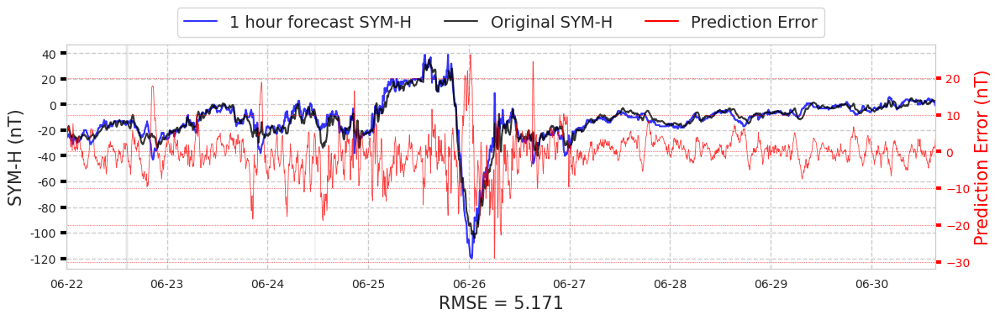

Plot for storm 27


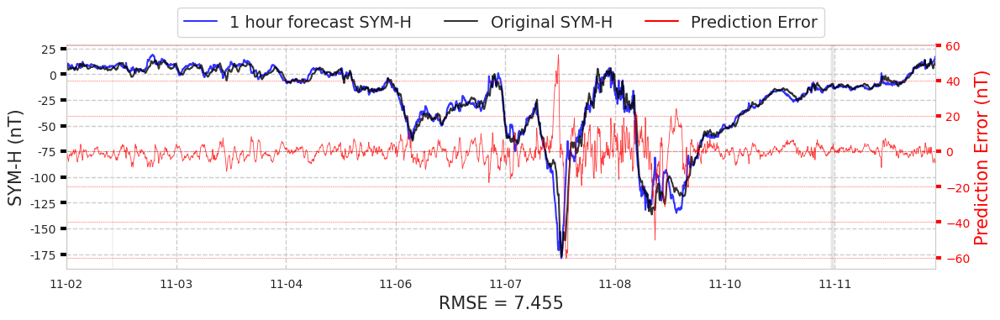

Plot for storm 28


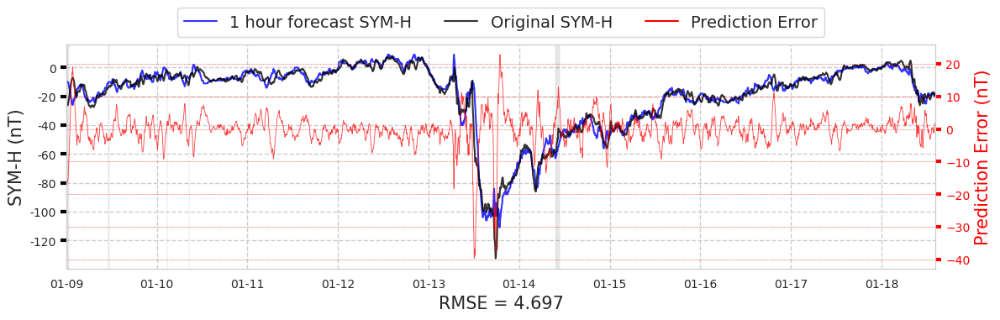

Plot for storm 29


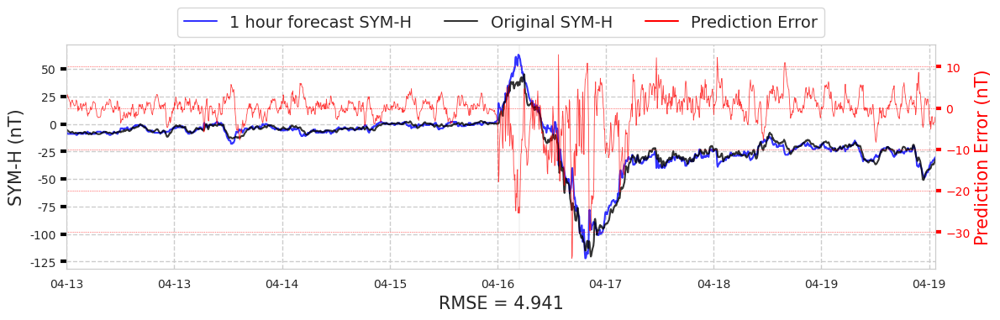

Plot for storm 30


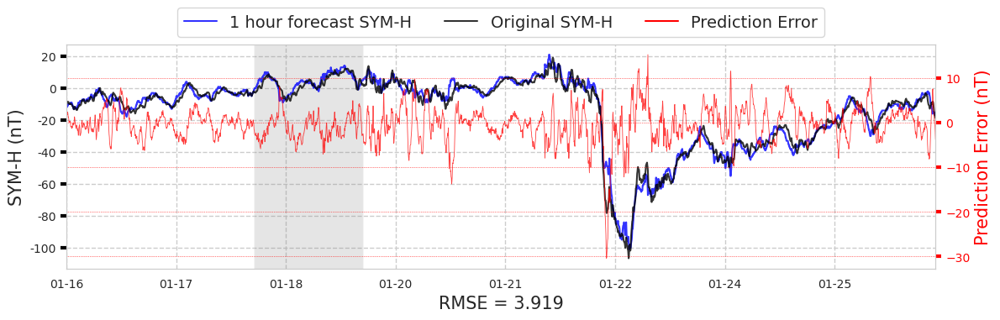

Plot for storm 31


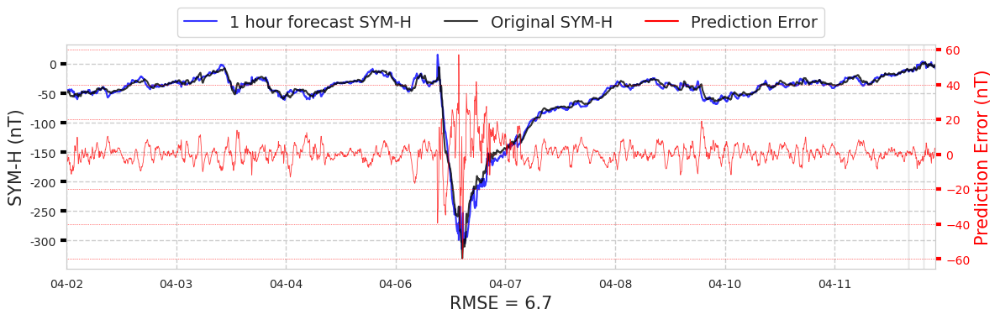

Plot for storm 32


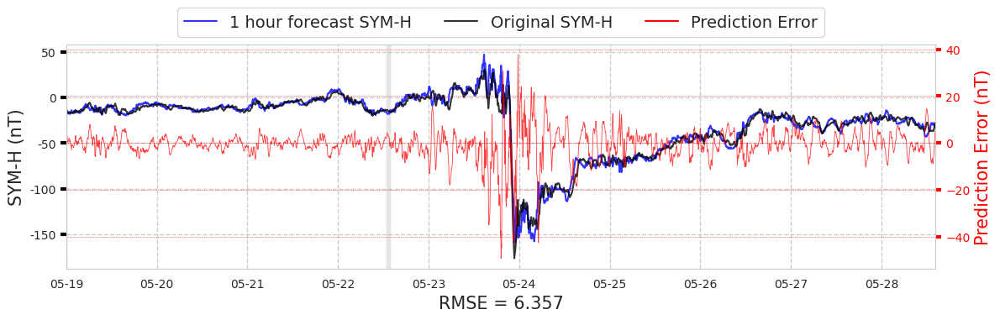

Plot for storm 33


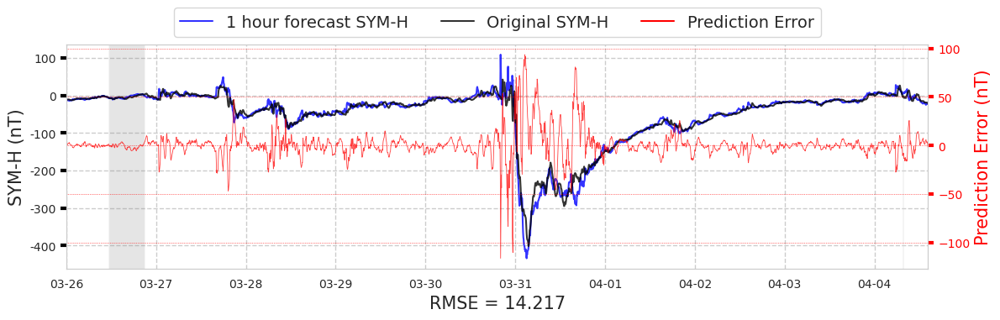

Plot for storm 34


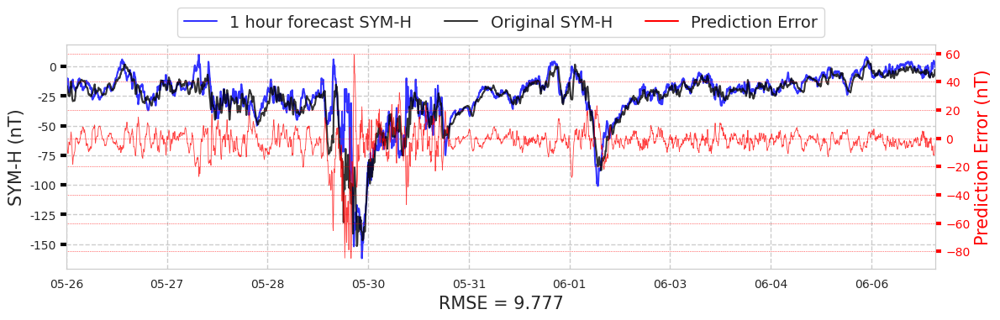

Plot for storm 35


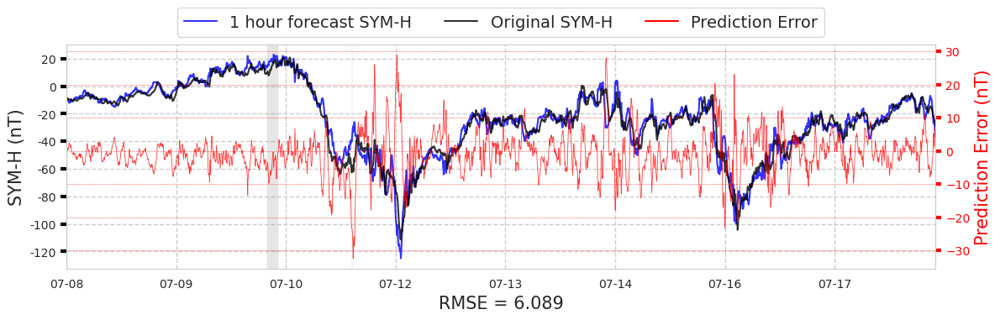

Plot for storm 36


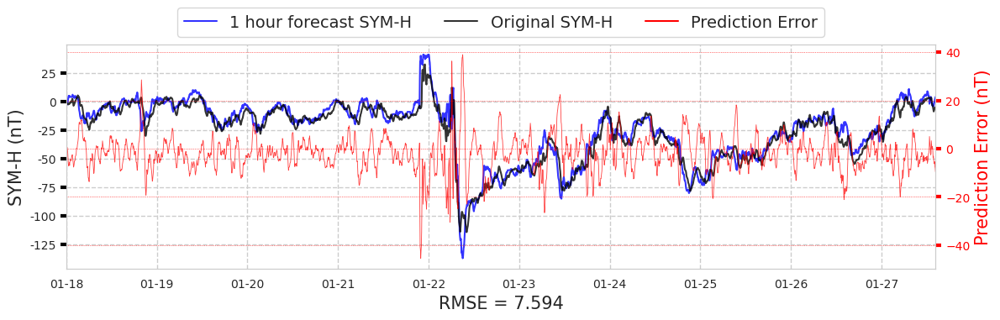

Plot for storm 37


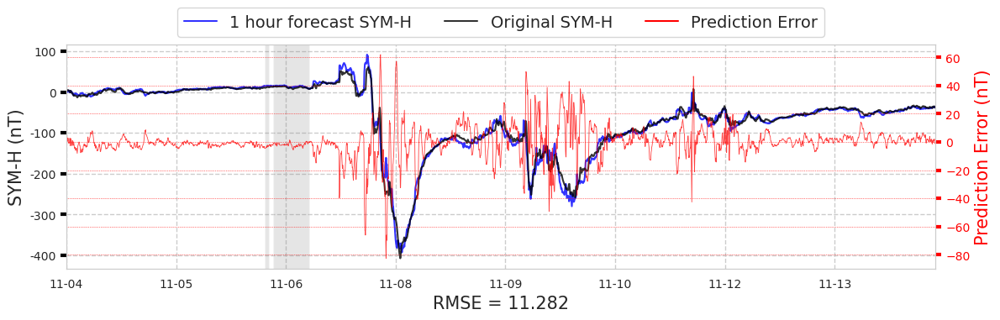

Plot for storm 38


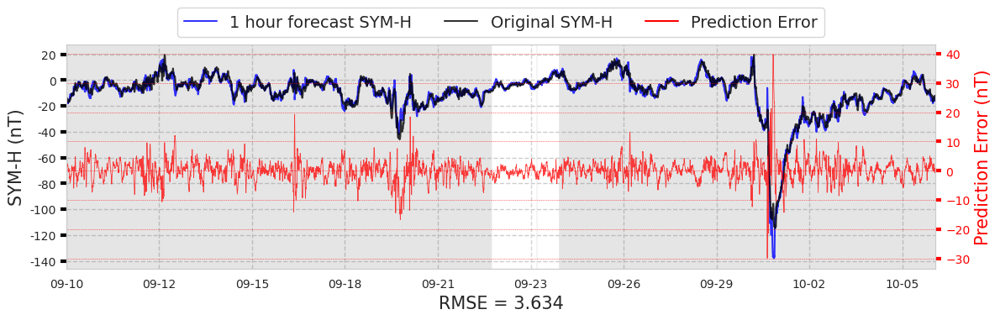

Plot for storm 39


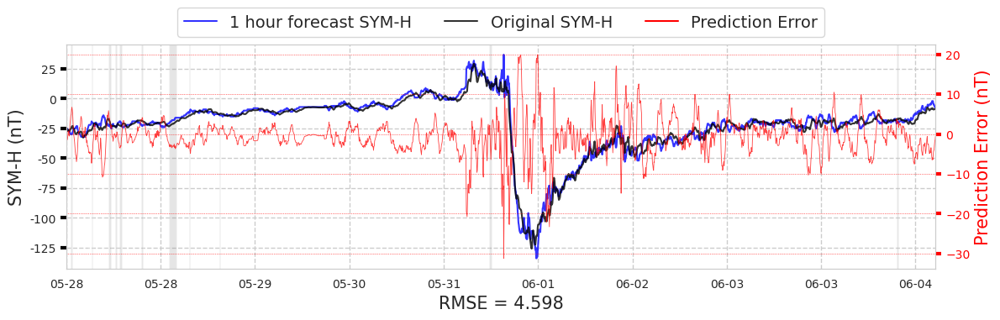

Plot for storm 40


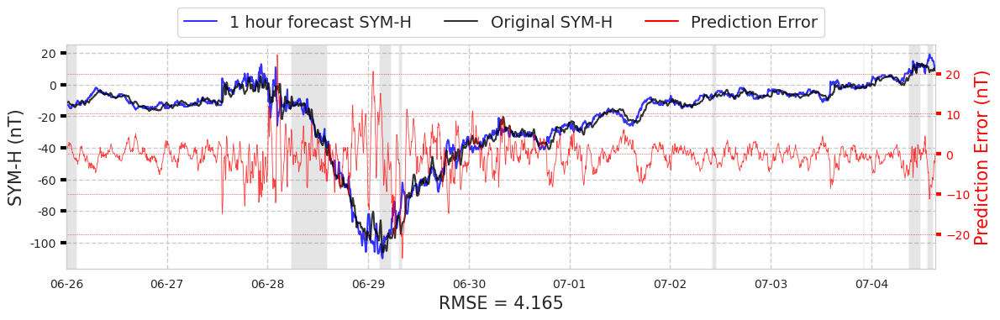

Plot for storm 41


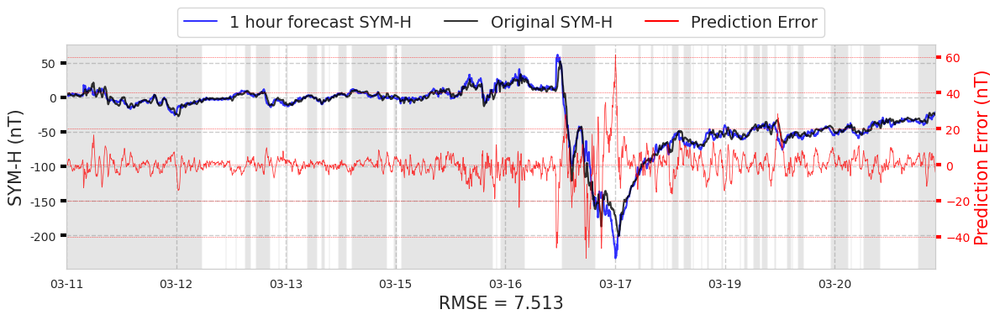

Plot for storm 42


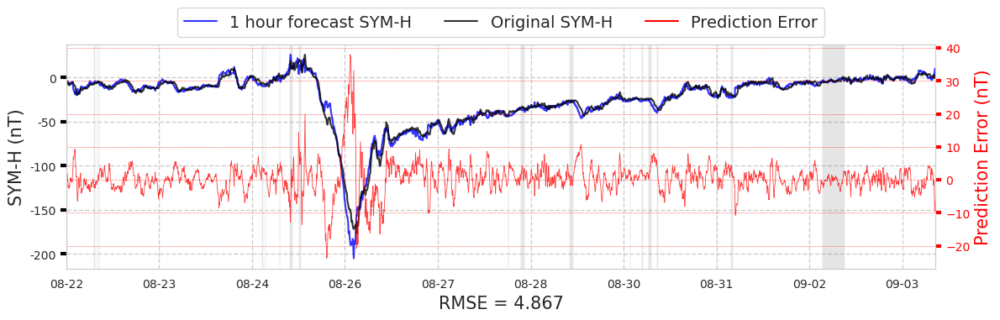

Plot for storm 26


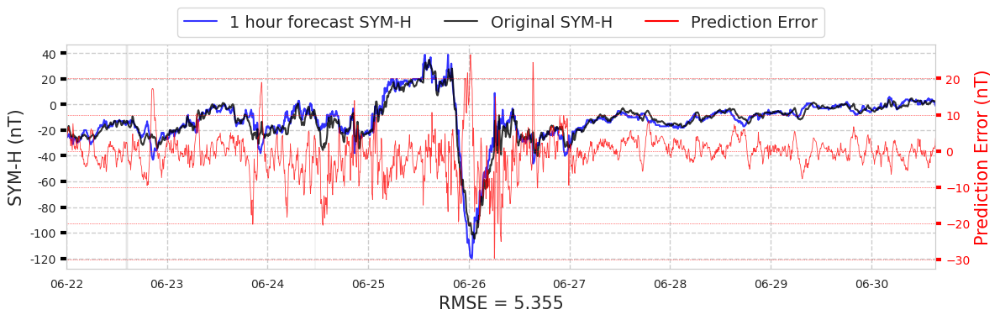

Plot for storm 27


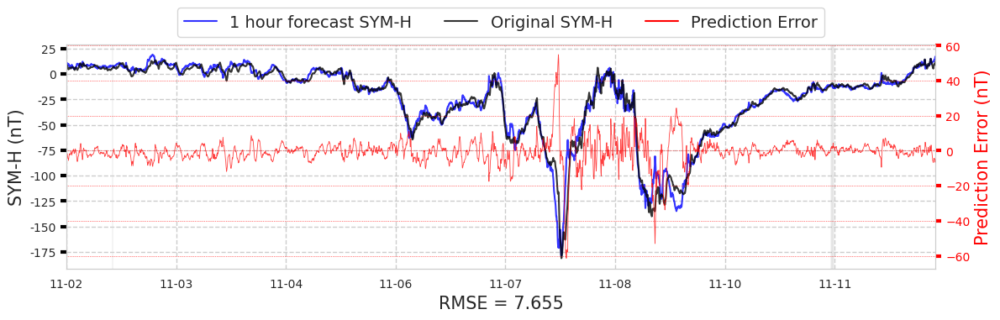

Plot for storm 28


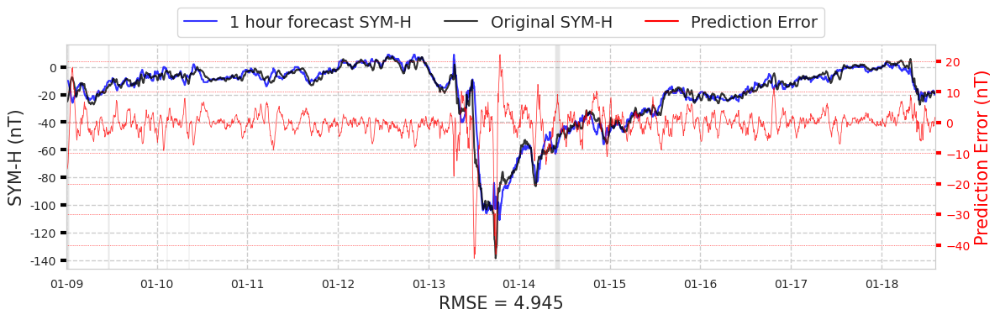

Plot for storm 29


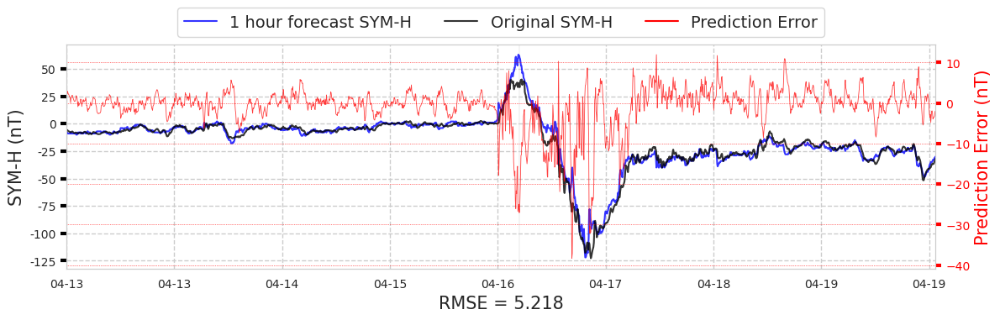

Plot for storm 30


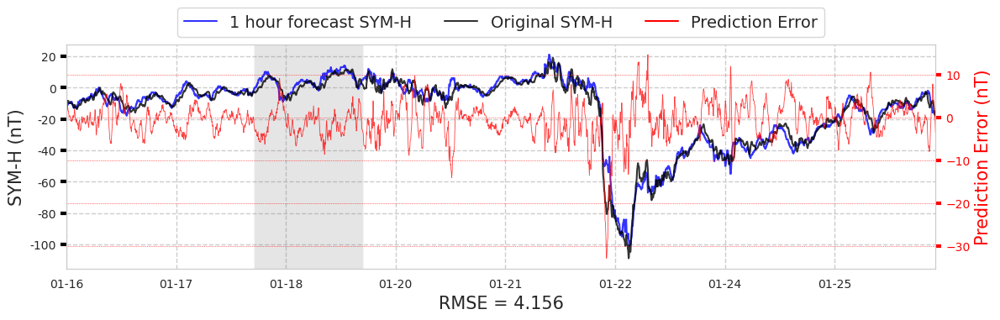

Plot for storm 31


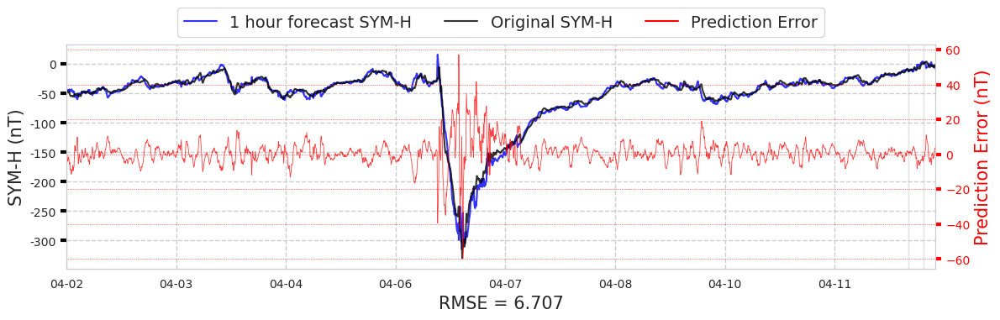

Plot for storm 32


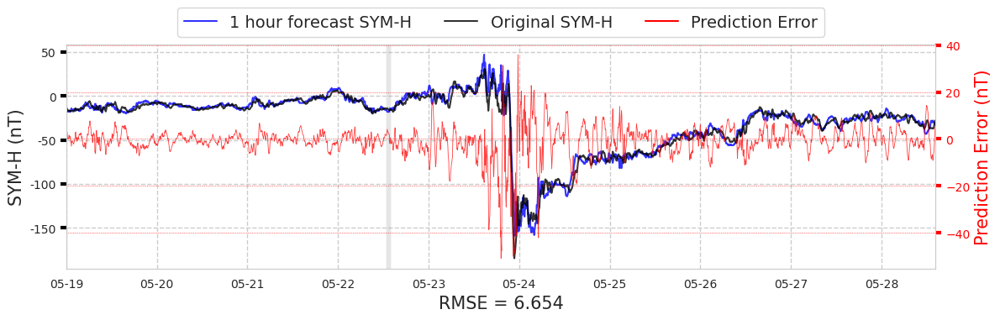

Plot for storm 33


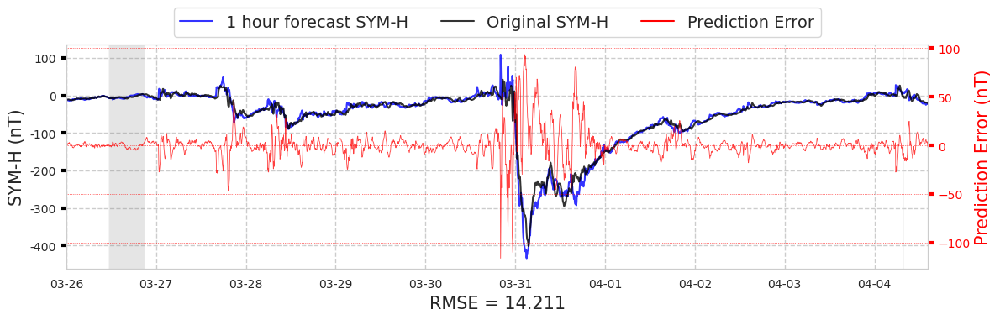

Plot for storm 34


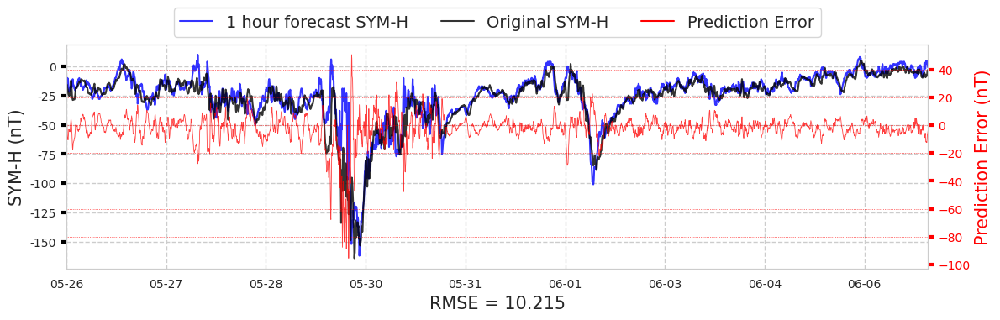

Plot for storm 35


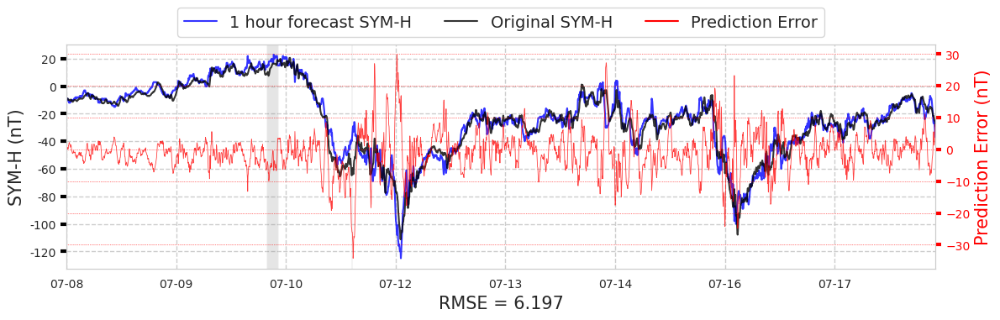

Plot for storm 36


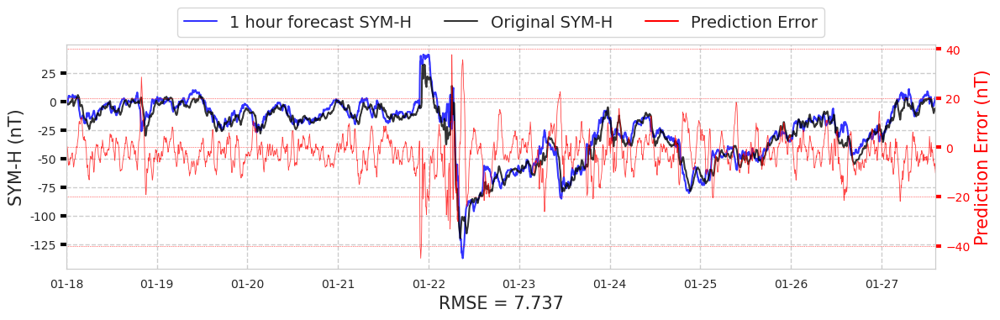

Plot for storm 37


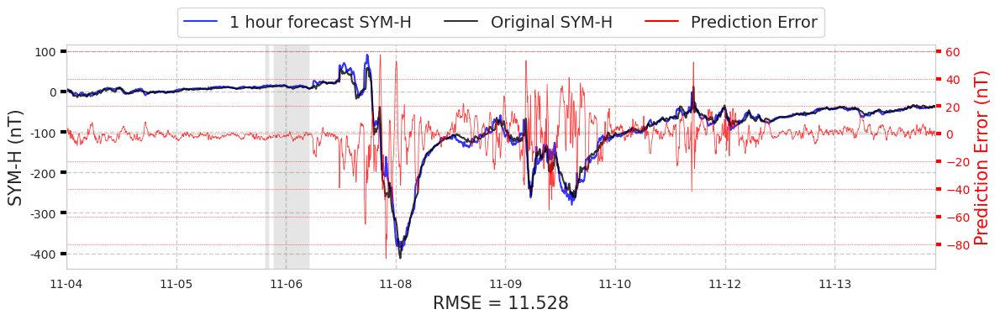

Plot for storm 38


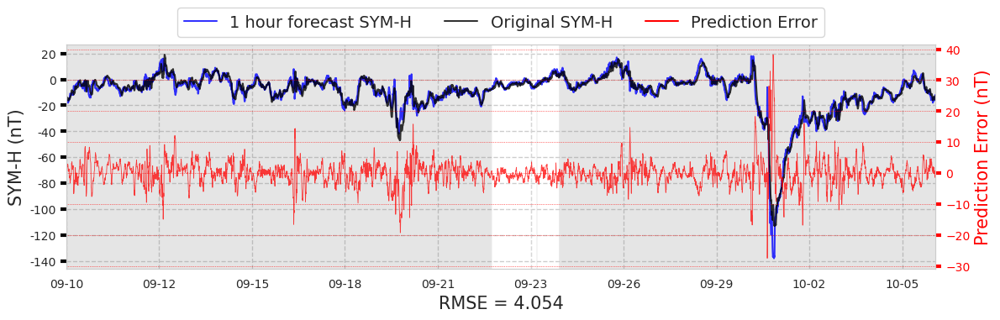

Plot for storm 39


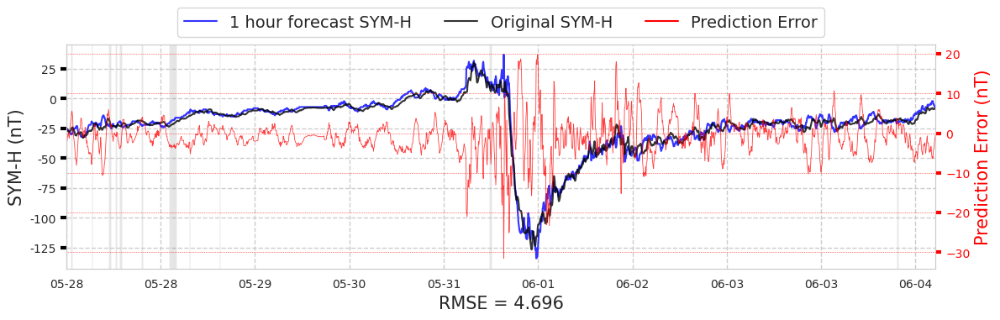

Plot for storm 40


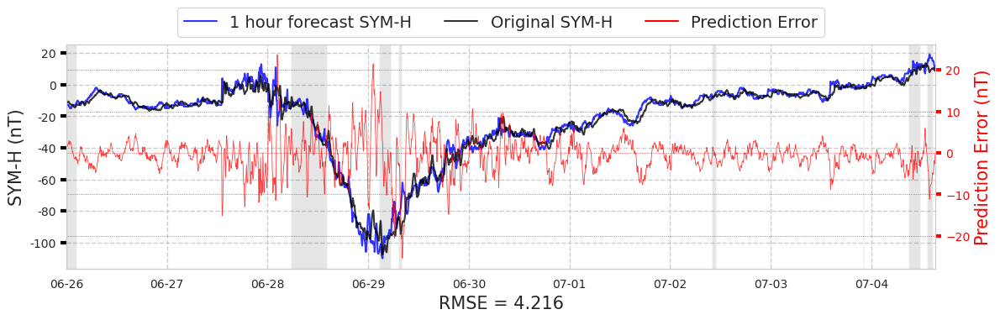

Plot for storm 41


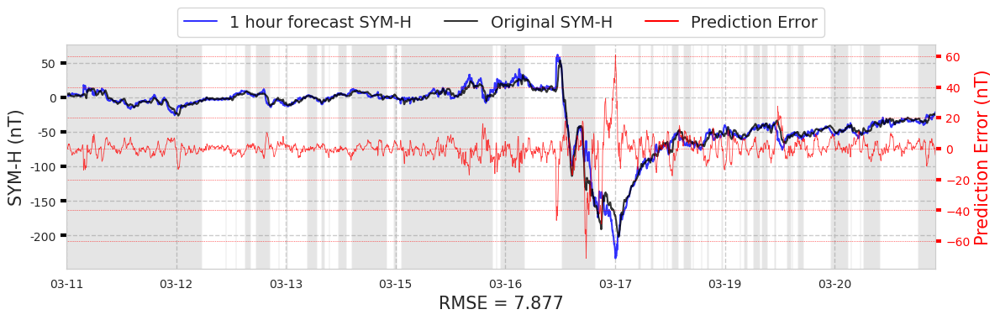

Plot for storm 42


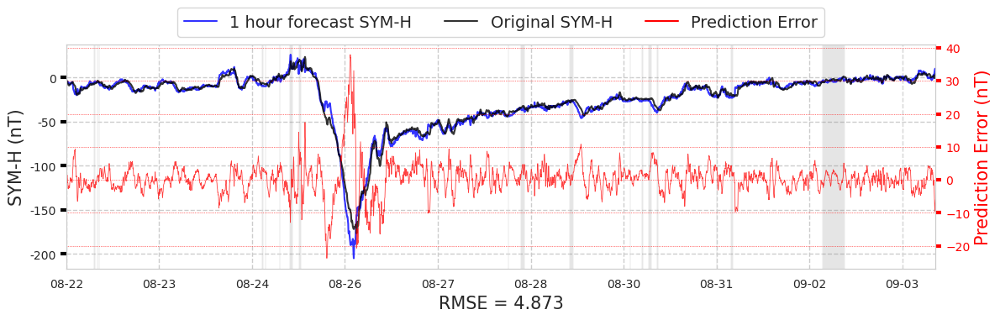

Plot for storm 26


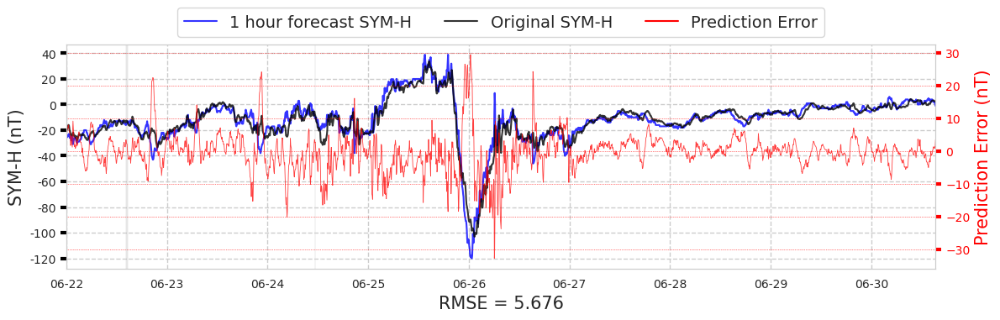

Plot for storm 27


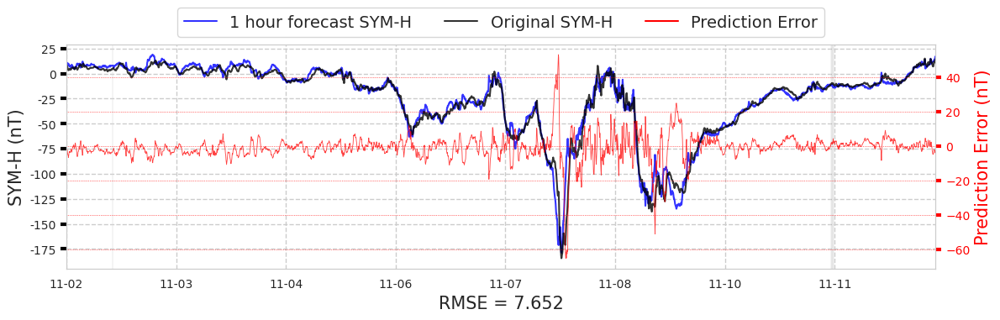

Plot for storm 28


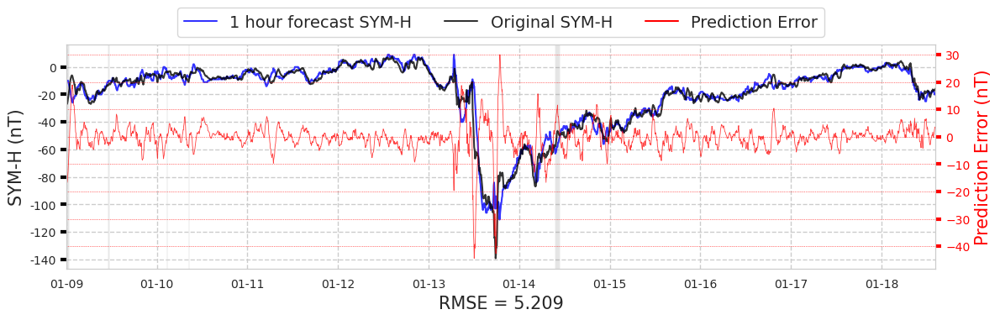

Plot for storm 29


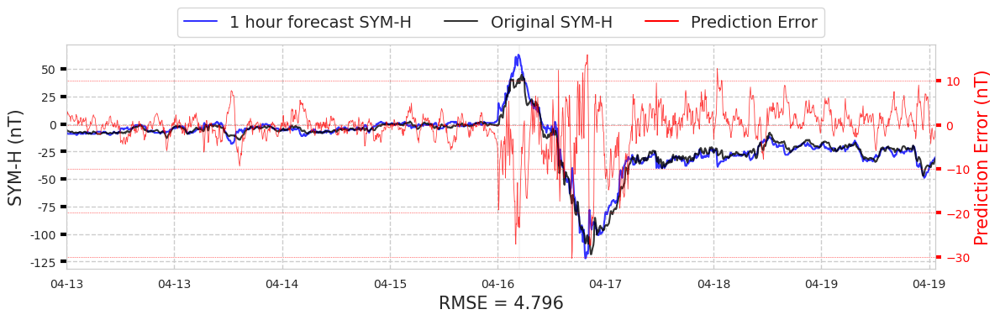

Plot for storm 30


In [ ]:
storm_texts = []

base_path = './supporting_information/paper_plots_shade'
os.makedirs(base_path, exist_ok = True)

for pair_index, pair in enumerate(column_pairs):

    df_eval = pair[0].copy()
    og_col = pair[1]
    pred_col = pair[2]
    pred_title = pair[3]
    save_path = pair[4]
    plot_title = pair[5]

    os.makedirs(os.path.join(base_path, save_path), exist_ok = True)

    for i, storm_index in enumerate(storm_indices):

        print(f'Plot for storm {storm_index}')
        
        df = df_eval[TEST_STORM_STARTS[i] : TEST_STORM_ENDS[i]].copy()
        ticks_labels = list(df.index)
        swepam_sect = df_swepam[df.index[0] : df.index[-1]].copy()
        df = df.reset_index()
    
        def format_fn(tick_val, tick_pos):            
            if int(tick_val) in df.index:
                return ticks_labels[int(tick_val)].strftime('%m-%d')
            else:
                return ''

        fig, ax = plt.subplots(1, 1, figsize = (12, 4))
        lin_pred = df[og_col].plot(ax = ax, color = "blue", label = pred_title, alpha = 0.8)
        lin_og = df[pred_col].plot(ax = ax, color = "black", label = "Original SYM-H", alpha = 0.8)
        ax.grid(True, linestyle="--", axis="both", which="both", linewidth=1)
        ax.tick_params(axis="y", color="black", labelsize=10, width=3, length=5)
        ax.tick_params(axis="x", color="black", which = 'both', labelsize=10, width=3, length=5)
        ax.set_ylabel('SYM-H (nT)', fontsize = 15)
        mse = np.round(msem(df[pred_col], df[og_col], squared = False), 3)
        ax.set_xlabel(f'RMSE = {mse}', fontsize = 15)
        
        if pair_index == 0:
            storm_texts.append(f'Storm Number {storm_index} -- {df["datetime"][len(df) // 2].month_name()} of {df["datetime"][len(df) // 2].year}')
            
        twin = ax.twinx()

        df['diff'] = df[pred_col] - df[og_col]
        df['diff'].plot(ax = twin, color = 'red', linewidth = 0.6, alpha = 0.75, label = 'Prediction Error')

        twin.set_ylabel('Prediction Error (nT)', color = 'red', fontsize = 15)
        twin.grid(True, color="red", linestyle=":", axis="y", which="both", linewidth=0.5)
        twin.tick_params(axis="y", colors="red", labelsize=10, width=3, length=5)    
        ax.xaxis.set_major_formatter(format_fn)
        ax.xaxis.set_major_locator(MaxNLocator(integer=True))
        ax.get_yaxis().set_major_formatter(mtick.FormatStrFormatter('%.0f'))
        plt.rcParams['axes.axisbelow'] = True
        
        ax.plot(0,0, color = 'red', label = 'Prediction Error')

        ax.legend(bbox_to_anchor=(0.5, 1.2), loc="upper center", 
              ncol = 3, fancybox = True, prop={'size':14})
        
        ymin, ymax = ax.get_ylim()        
        ax.fill_between(
            df.index,
            -99999,
            99999,
            where = swepam_sect['missing_swepam_float'] == 1,
            facecolor="gray",
            alpha=0.2,
            interpolate = False,            
        )
        
        ax.set_ylim(ymin, ymax)
        ax.set_xlim(df.index[0], df.index[-1])
        
        fig.tight_layout()
        fig.savefig(os.path.join(base_path, save_path, f"{save_path}_storm_{storm_index}.png"), dpi=400)
        plt.show();
        